# LASAgent_Actor_Critic interacts with small LAS
This file is to test learning results with small size Living Architecture System.

**Observation**: 
*  proximity sensor: 15 * 1, range: 0 or 1
* light color: 15 * 3, range: (0,1)

**Action**: 
* sma: 15 * 1, range: (0,1)
* light color: 15 * 3, range: (0,1)
## Exploration method

In [1]:
import sys
import os
sys.path.append(os.path.abspath('../'))

In [2]:
import tensorflow as tf
import numpy as np
import gym
from gym import wrappers
import tflearn
import argparse
import pprint as pp
from collections import deque

from IPython.core.debugger import Tracer

from Environment.LASEnv import LASEnv
from LASAgent.LASAgent_Actor_Critic import LASAgent_Actor_Critic


import matplotlib.pyplot as plt
def plot_cumulative_reward(cumulativeReward):
    line, = plt.plot(cumulativeReward)
    plt.ion()
    plt.show()
    plt.pause(0.0001)
    


C:\ProgramData\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


curses is not supported on this machine (please install/reinstall curses for an optimal experience)


Initialize LASEnv ...
LASEnv connected to remote V-REP API server
Get objects' names and handles ...
Get Prox Sensor Success!!!!!
Proximity Sensor: ir_3_node#0, and handle: 16
Proximity Sensor: ir_2_node#0, and handle: 17
Proximity Sensor: ir_1_node#0, and handle: 18
Proximity Sensor: ir_3_node#1, and handle: 30
Proximity Sensor: ir_2_node#1, and handle: 31
Proximity Sensor: ir_1_node#1, and handle: 32
Proximity Sensor: ir_3_node#2, and handle: 44
Proximity Sensor: ir_2_node#2, and handle: 45
Proximity Sensor: ir_1_node#2, and handle: 46
Proximity Sensor: ir_3_node#3, and handle: 58
Proximity Sensor: ir_2_node#3, and handle: 59
Proximity Sensor: ir_1_node#3, and handle: 60
Proximity Sensor: ir_3_node#7, and handle: 72
Proximity Sensor: ir_2_node#7, and handle: 73
Proximity Sensor: ir_1_node#7, and handle: 74
Get Lihgt Success!!!!!
Light: omnidirect_light3_node#0, and handle: 26
Light: omnidirect_light2_node#0, and handle: 27
Light: omnidirect_light1_node#0, and handle: 28
Light: omnidi

C:\Users\lingheng\Documents\LAS_Gym\Environment\LASEnv.py:454: UserWarning: Remote function call: getLightStateAndColor fail in Class AnyLight.
  warnings.warn("Remote function call: getLightStateAndColor fail in Class AnyLight.")


| Reward: 35 | Episode: 0 


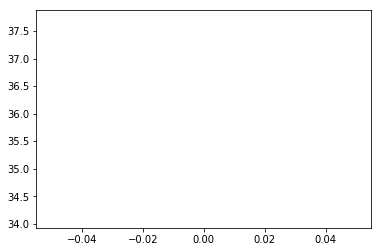

| Reward: 61 | Episode: 1 


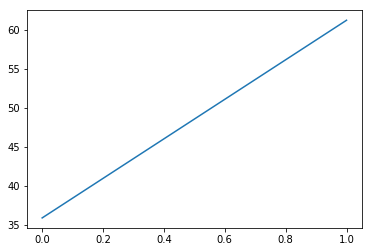

| Reward: 87 | Episode: 2 


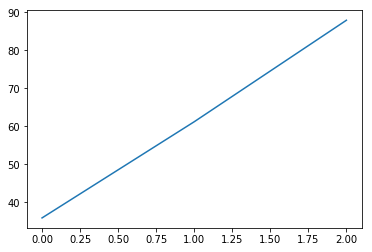

| Reward: 80 | Episode: 3 


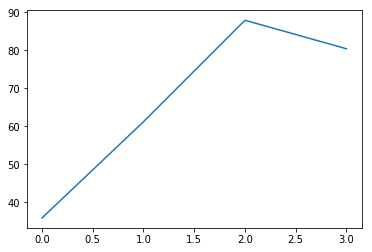

| Reward: 96 | Episode: 4 


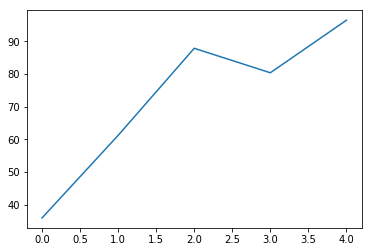

| Reward: 99 | Episode: 5 


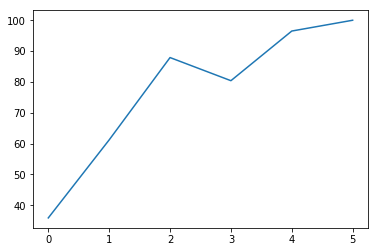

| Reward: 77 | Episode: 6 


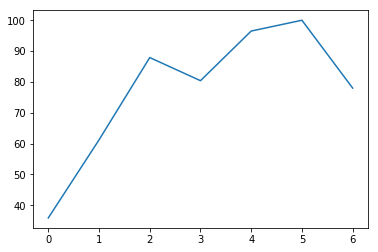

| Reward: 83 | Episode: 7 


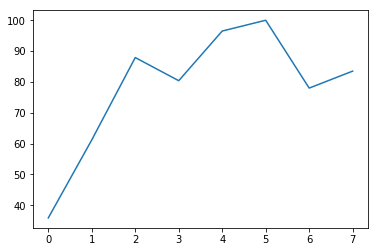

| Reward: 87 | Episode: 8 


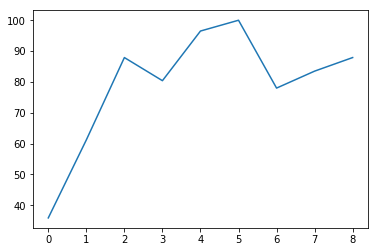

| Reward: 99 | Episode: 9 


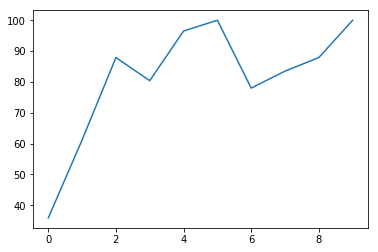

| Reward: 98 | Episode: 10 


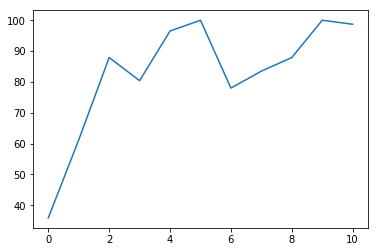

| Reward: 94 | Episode: 11 


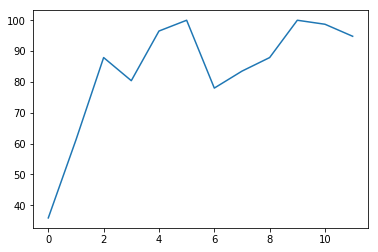

| Reward: 99 | Episode: 12 


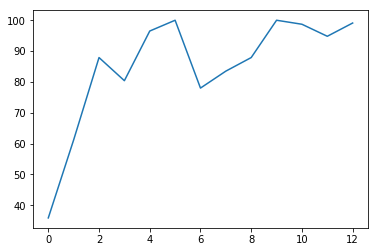

| Reward: 99 | Episode: 13 


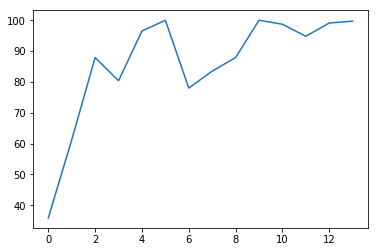

| Reward: 98 | Episode: 14 


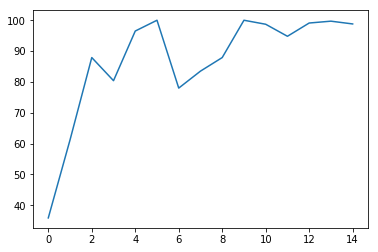

| Reward: 99 | Episode: 15 


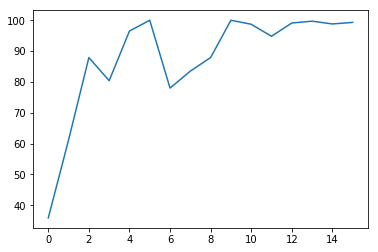

| Reward: 98 | Episode: 16 


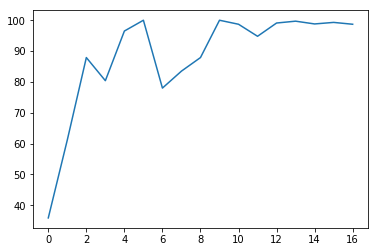

| Reward: 85 | Episode: 17 


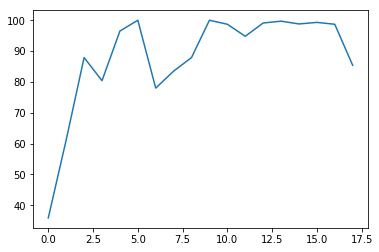

| Reward: 99 | Episode: 18 


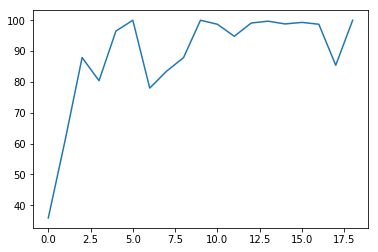

| Reward: 72 | Episode: 19 


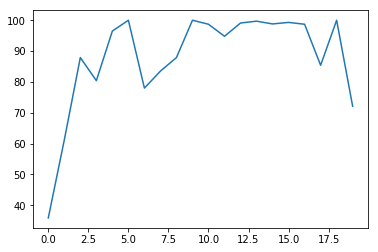

| Reward: 50 | Episode: 20 


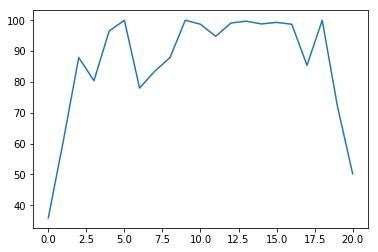

| Reward: 31 | Episode: 21 


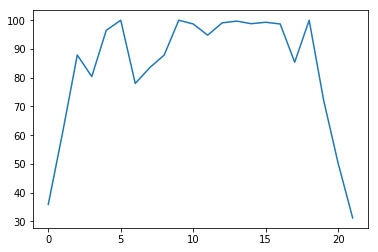

| Reward: 66 | Episode: 22 


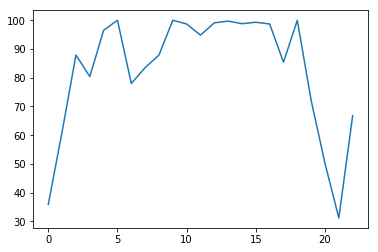

| Reward: 34 | Episode: 23 


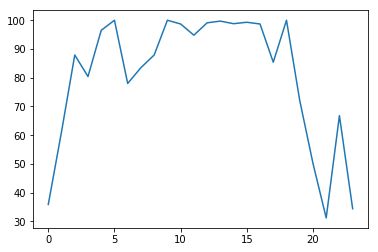

| Reward: 0 | Episode: 24 


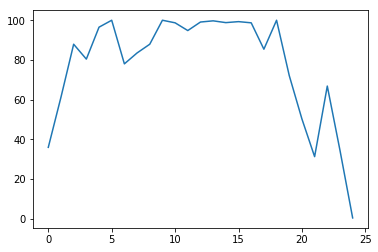

| Reward: 36 | Episode: 25 


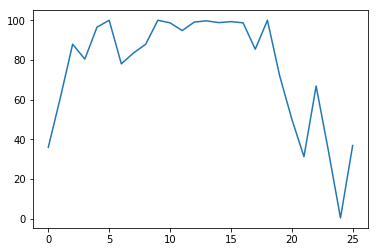

| Reward: 86 | Episode: 26 


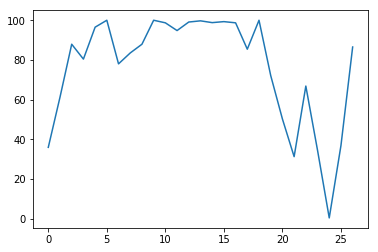

| Reward: 4 | Episode: 27 


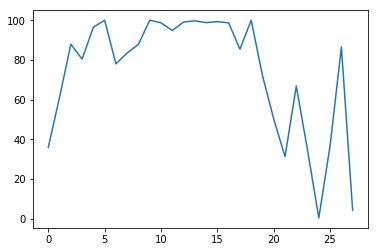

| Reward: 0 | Episode: 28 


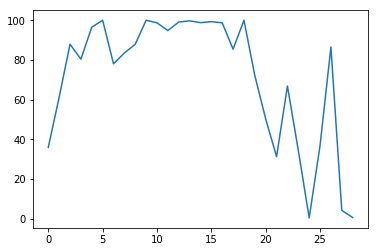

| Reward: 0 | Episode: 29 


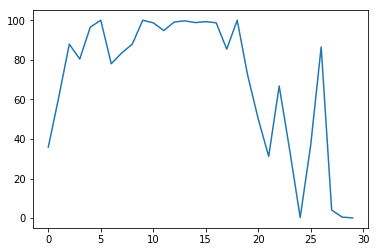

| Reward: 0 | Episode: 30 


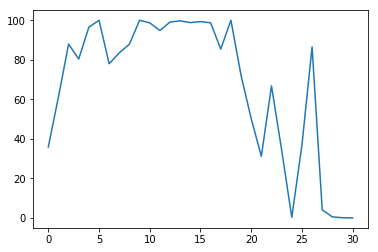

| Reward: 0 | Episode: 31 


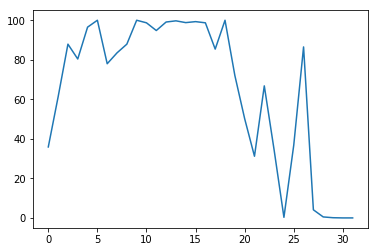

| Reward: 0 | Episode: 32 


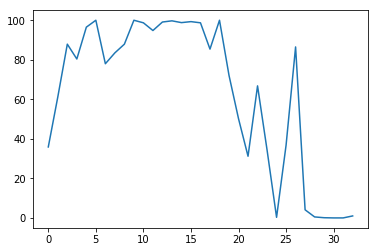

| Reward: 0 | Episode: 33 


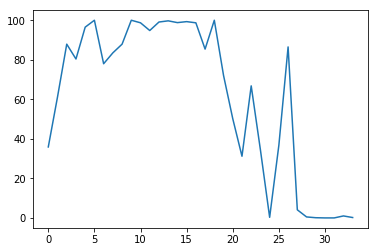

| Reward: 28 | Episode: 34 


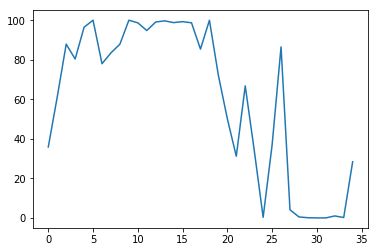

| Reward: 16 | Episode: 35 


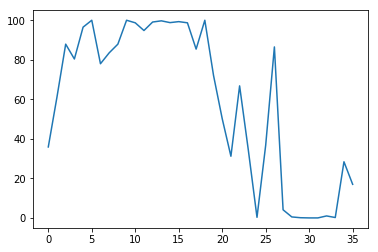

| Reward: 73 | Episode: 36 


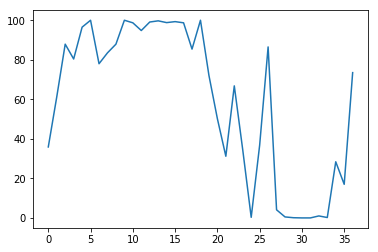

| Reward: 67 | Episode: 37 


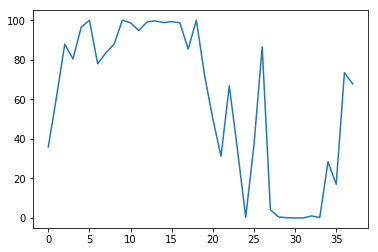

| Reward: 64 | Episode: 38 


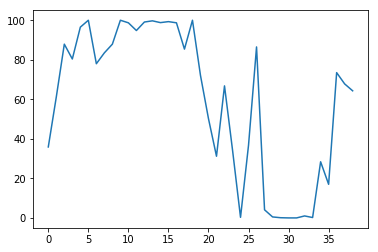

| Reward: 16 | Episode: 39 


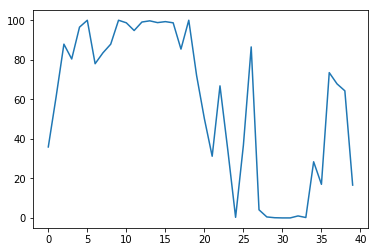

| Reward: 45 | Episode: 40 


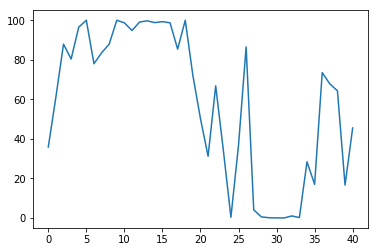

| Reward: 25 | Episode: 41 


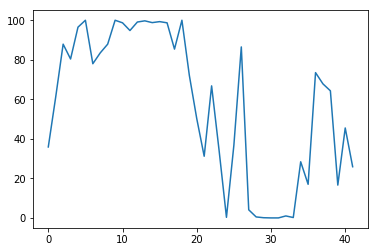

| Reward: 0 | Episode: 42 


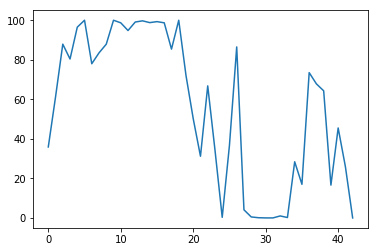

| Reward: 26 | Episode: 43 


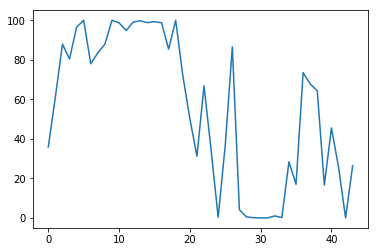

| Reward: 45 | Episode: 44 


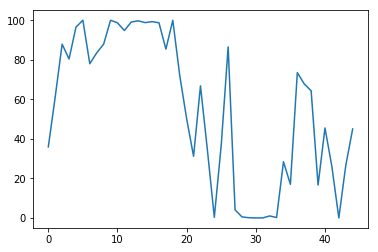

| Reward: 98 | Episode: 45 


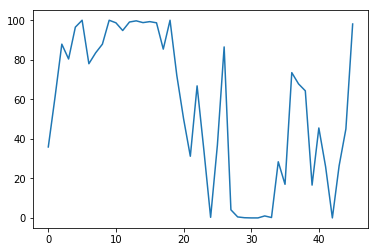

| Reward: 78 | Episode: 46 


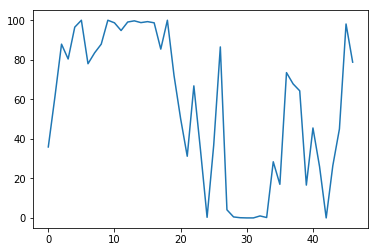

| Reward: 68 | Episode: 47 


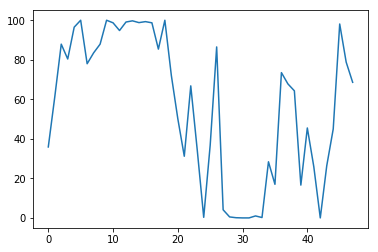

| Reward: 79 | Episode: 48 


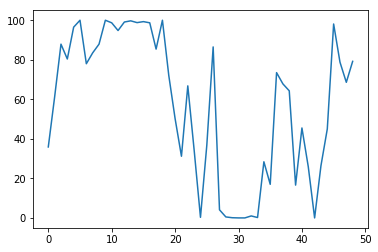

| Reward: 99 | Episode: 49 


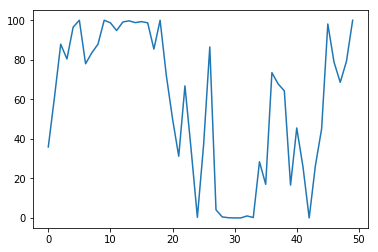

| Reward: 99 | Episode: 50 


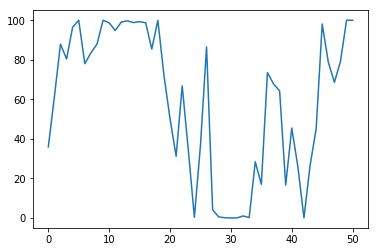

| Reward: 81 | Episode: 51 


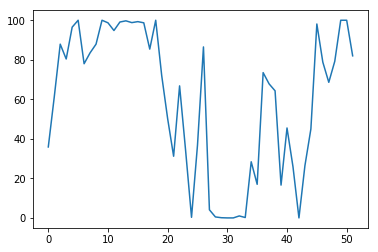

| Reward: 50 | Episode: 52 


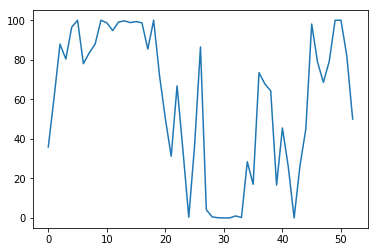

| Reward: 60 | Episode: 53 


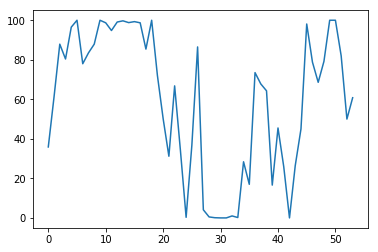

| Reward: 59 | Episode: 54 


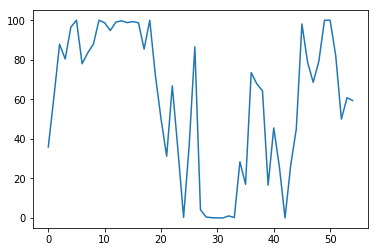

| Reward: 43 | Episode: 55 


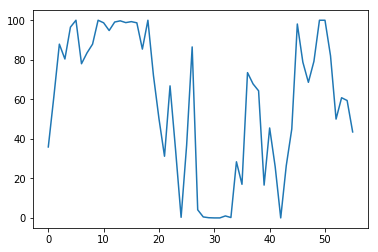

| Reward: 51 | Episode: 56 


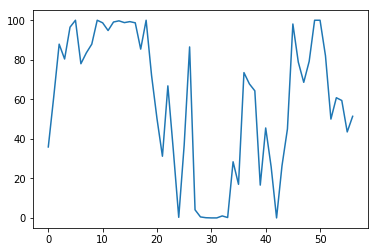

| Reward: 98 | Episode: 57 


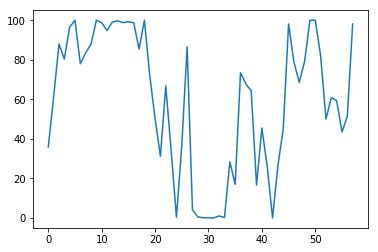

| Reward: 79 | Episode: 58 


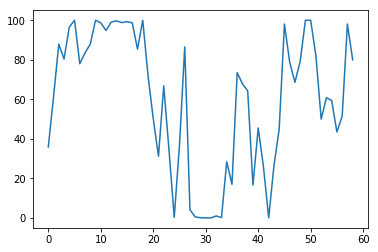

| Reward: 39 | Episode: 59 


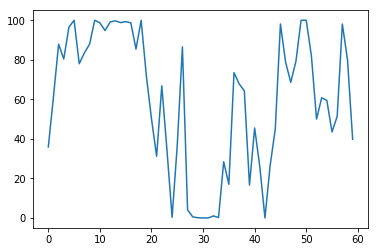

| Reward: 44 | Episode: 60 


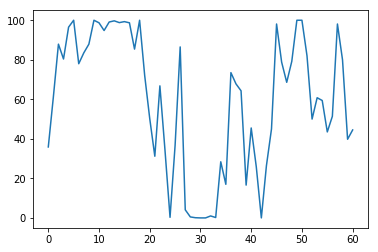

| Reward: 74 | Episode: 61 


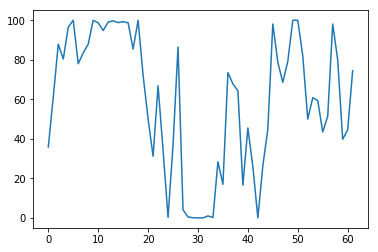

| Reward: 79 | Episode: 62 


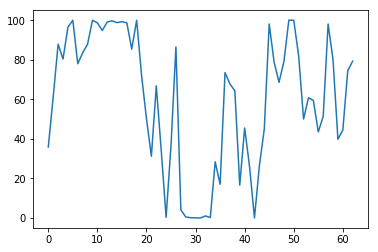

| Reward: 93 | Episode: 63 


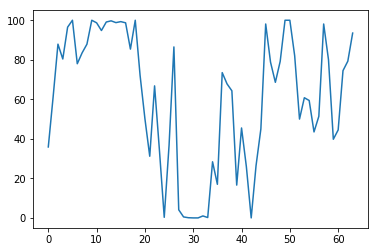

| Reward: 99 | Episode: 64 


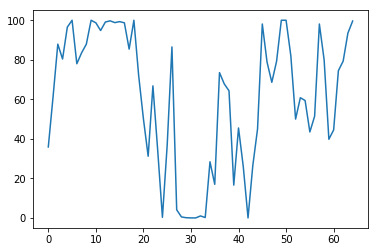

| Reward: 63 | Episode: 65 


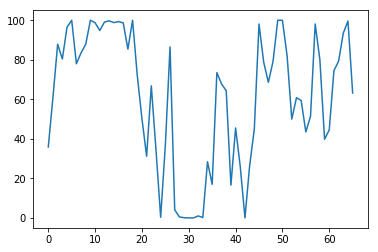

| Reward: 88 | Episode: 66 


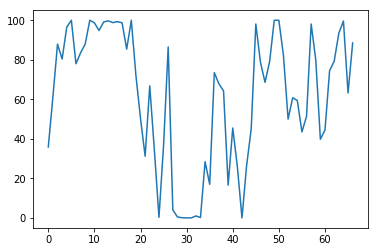

| Reward: 93 | Episode: 67 


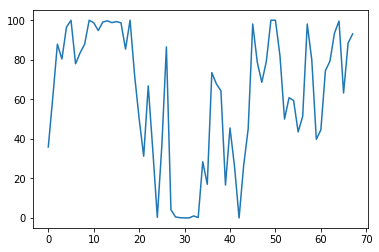

| Reward: 83 | Episode: 68 


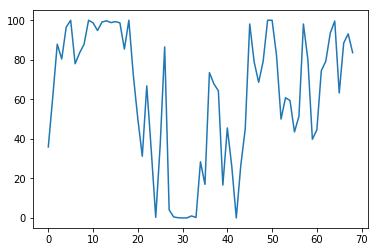

| Reward: 19 | Episode: 69 


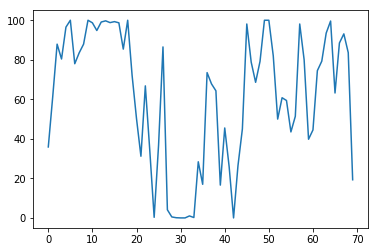

| Reward: 74 | Episode: 70 


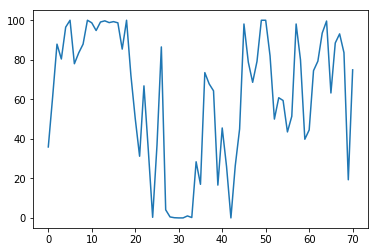

| Reward: 59 | Episode: 71 


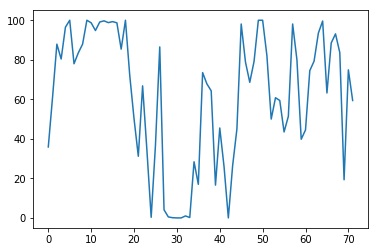

| Reward: 98 | Episode: 72 


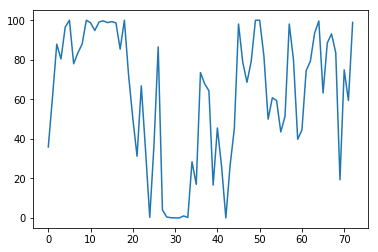

| Reward: 89 | Episode: 73 


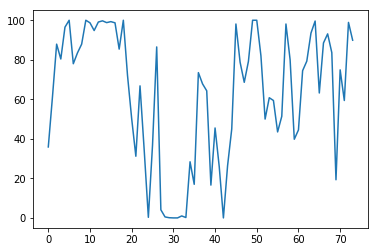

| Reward: 87 | Episode: 74 


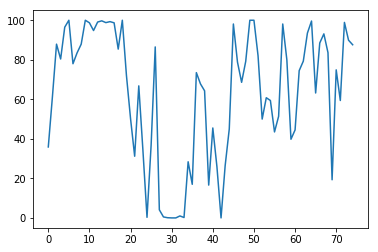

| Reward: 47 | Episode: 75 


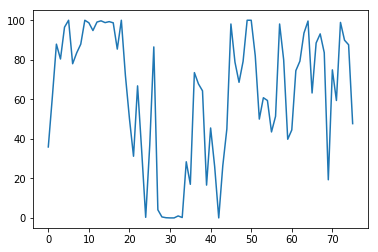

| Reward: 99 | Episode: 76 


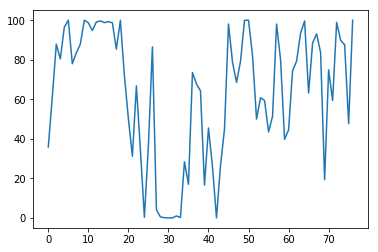

| Reward: 99 | Episode: 77 


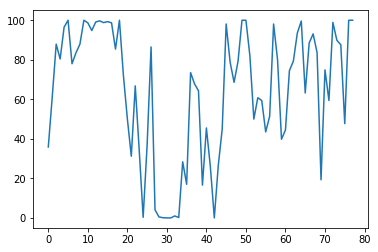

| Reward: 99 | Episode: 78 


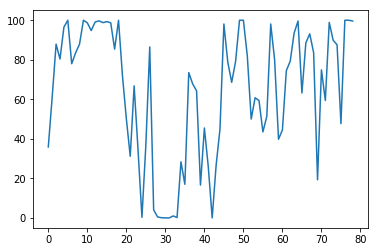

| Reward: 139 | Episode: 79 


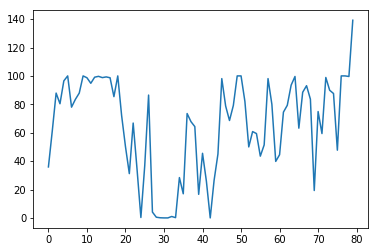

| Reward: 99 | Episode: 80 


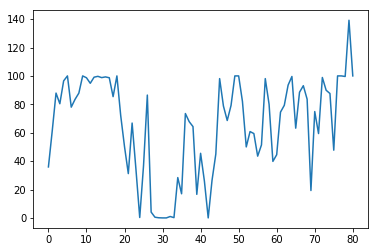

| Reward: 92 | Episode: 81 


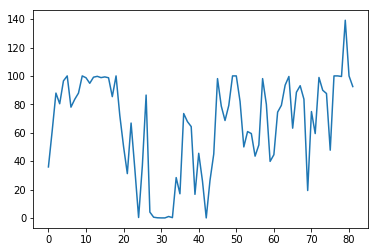

| Reward: 87 | Episode: 82 


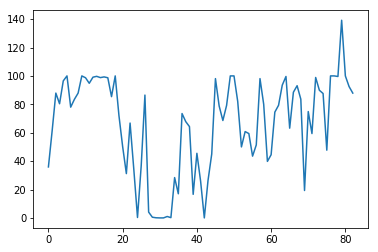

| Reward: 73 | Episode: 83 


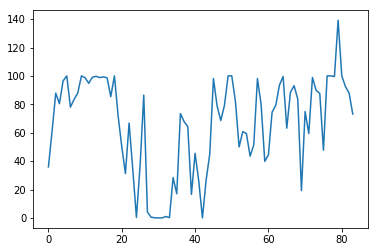

| Reward: 93 | Episode: 84 


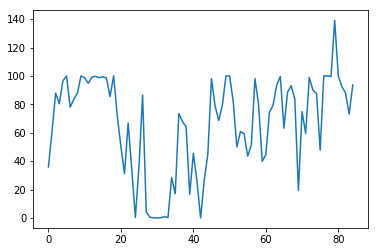

| Reward: 99 | Episode: 85 


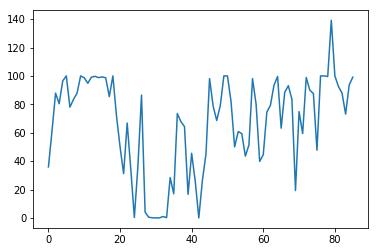

| Reward: 98 | Episode: 86 


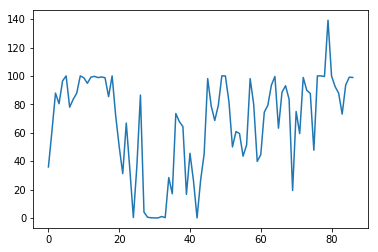

| Reward: 95 | Episode: 87 


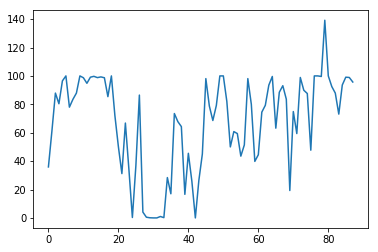

| Reward: 99 | Episode: 88 


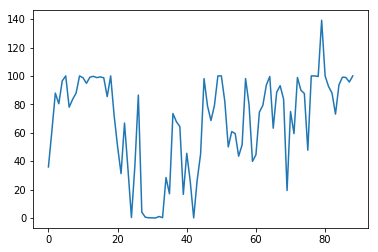

| Reward: 99 | Episode: 89 


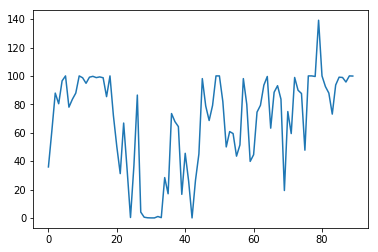

| Reward: 87 | Episode: 90 


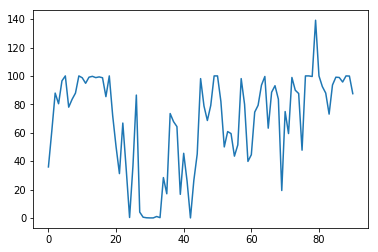

| Reward: 99 | Episode: 91 


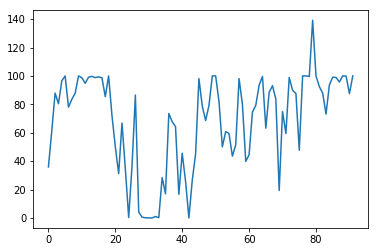

| Reward: 95 | Episode: 92 


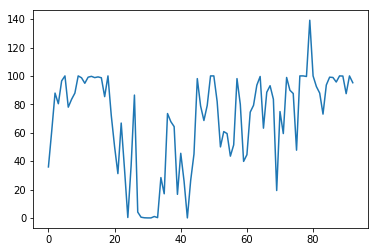

| Reward: 124 | Episode: 93 


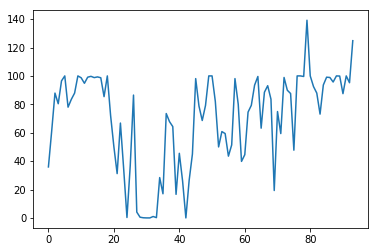

| Reward: 105 | Episode: 94 


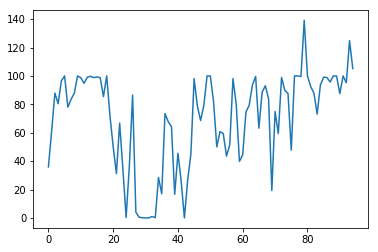

| Reward: 86 | Episode: 95 


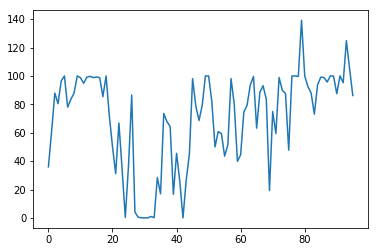

| Reward: 107 | Episode: 96 


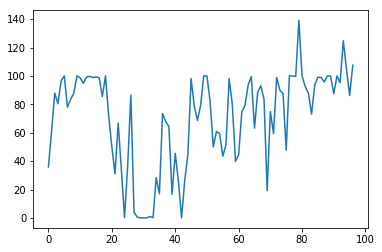

| Reward: 109 | Episode: 97 


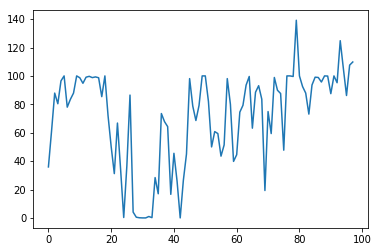

| Reward: 154 | Episode: 98 


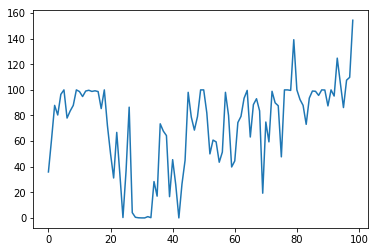

| Reward: 127 | Episode: 99 


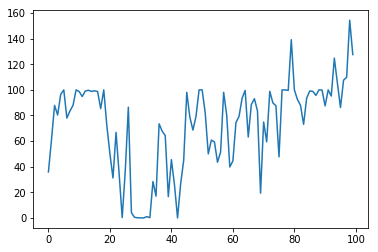

| Reward: 94 | Episode: 100 


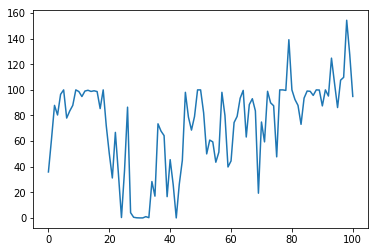

| Reward: 89 | Episode: 101 


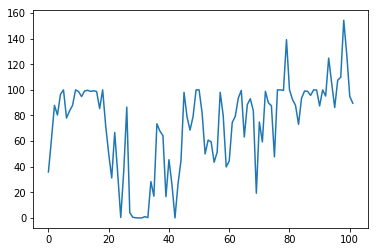

| Reward: 108 | Episode: 102 


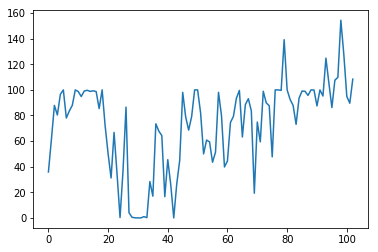

| Reward: 99 | Episode: 103 


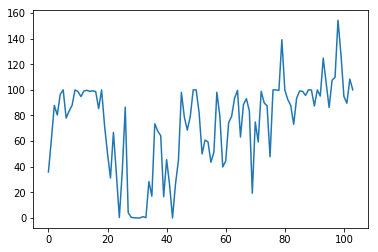

| Reward: 99 | Episode: 104 


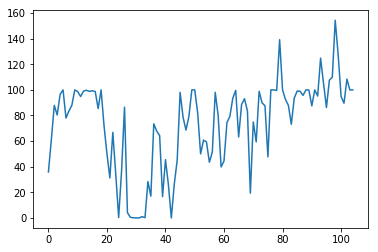

| Reward: 98 | Episode: 105 


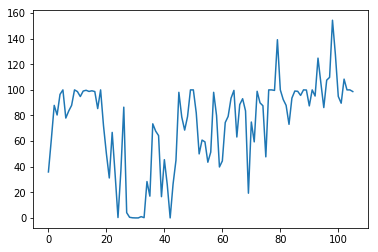

| Reward: 82 | Episode: 106 


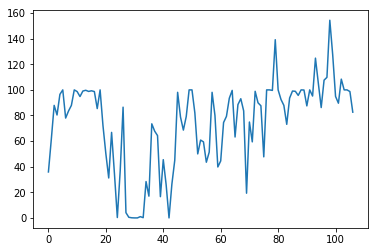

| Reward: 57 | Episode: 107 


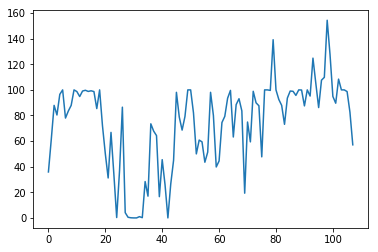

| Reward: 51 | Episode: 108 


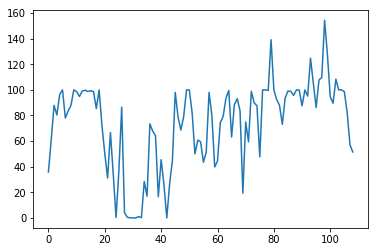

| Reward: 20 | Episode: 109 


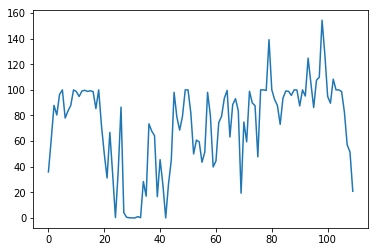

| Reward: 47 | Episode: 110 


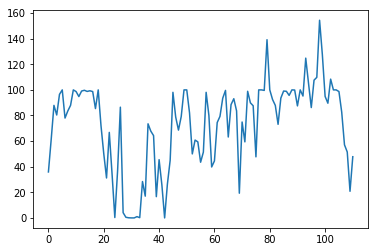

| Reward: 29 | Episode: 111 


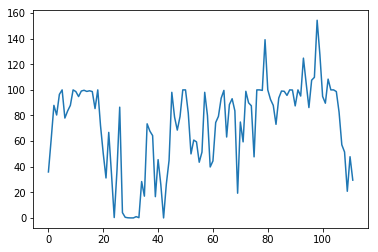

| Reward: 3 | Episode: 112 


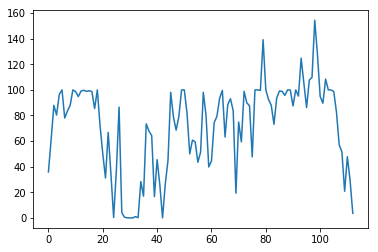

| Reward: 31 | Episode: 113 


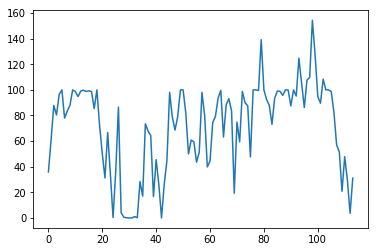

| Reward: 16 | Episode: 114 


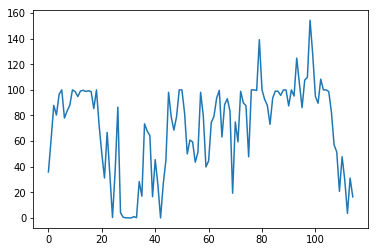

| Reward: 20 | Episode: 115 


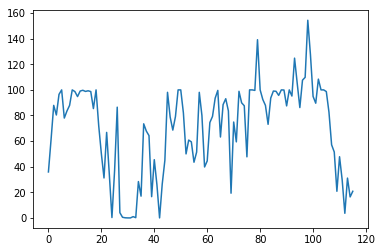

| Reward: 19 | Episode: 116 


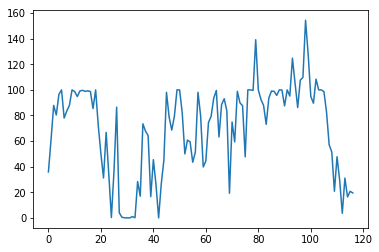

| Reward: 9 | Episode: 117 


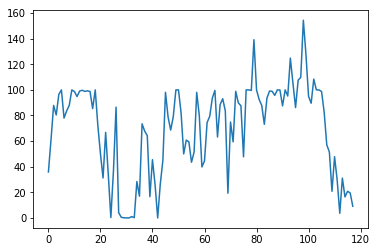

| Reward: 31 | Episode: 118 


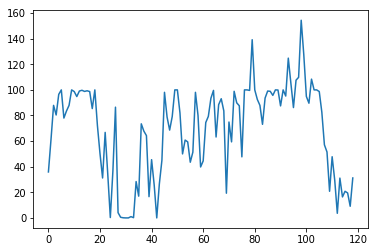

| Reward: 9 | Episode: 119 


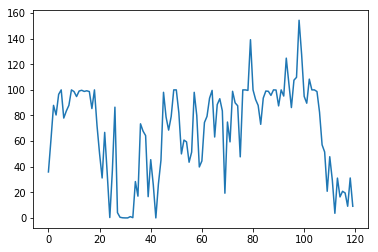

| Reward: 0 | Episode: 120 


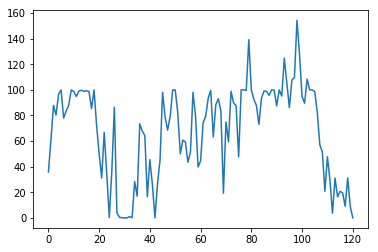

| Reward: 4 | Episode: 121 


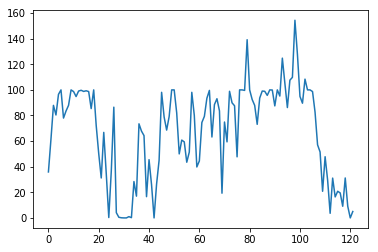

| Reward: 61 | Episode: 122 


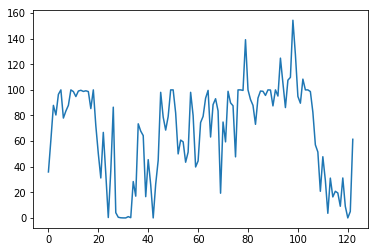

| Reward: 84 | Episode: 123 


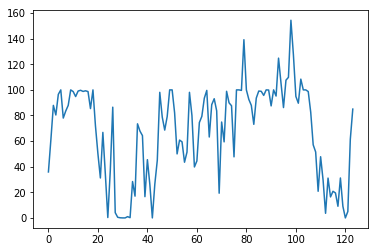

| Reward: 44 | Episode: 124 


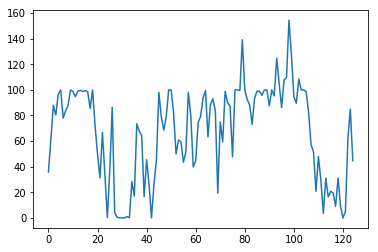

| Reward: 8 | Episode: 125 


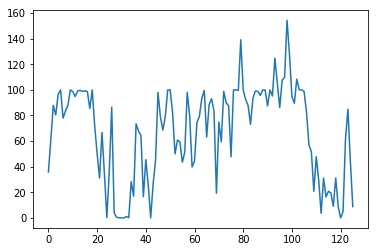

| Reward: 60 | Episode: 126 


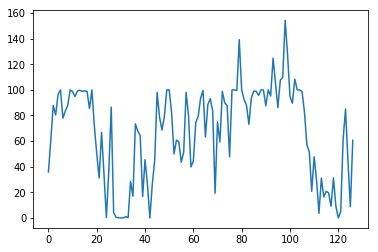

| Reward: 76 | Episode: 127 


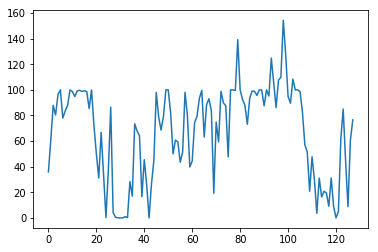

| Reward: 55 | Episode: 128 


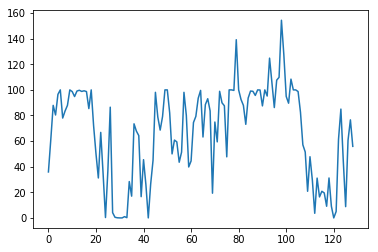

| Reward: 79 | Episode: 129 


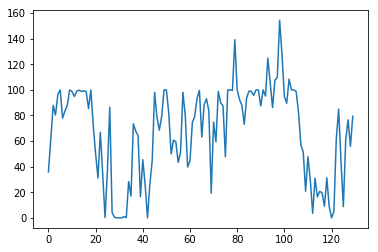

| Reward: 9 | Episode: 130 


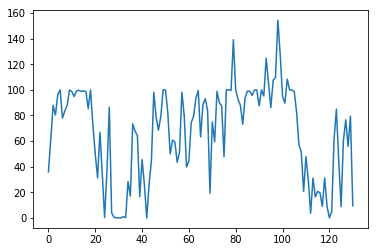

| Reward: 27 | Episode: 131 


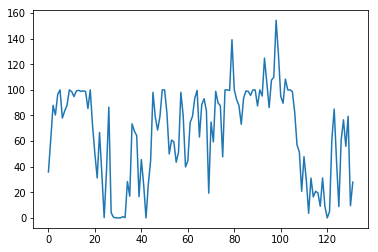

| Reward: 12 | Episode: 132 


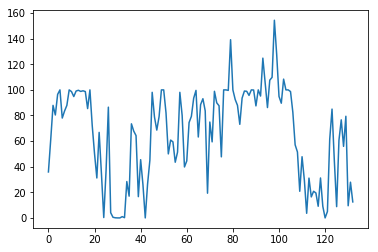

| Reward: 51 | Episode: 133 


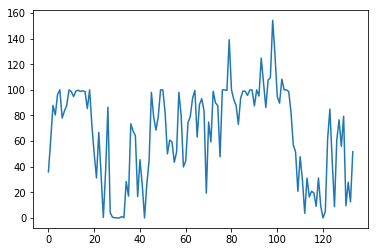

| Reward: 45 | Episode: 134 


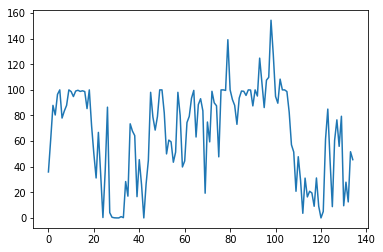

| Reward: 48 | Episode: 135 


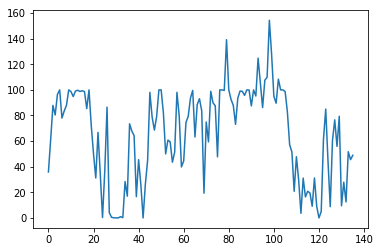

| Reward: 58 | Episode: 136 


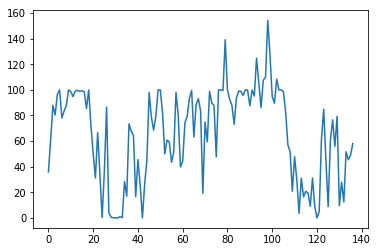

| Reward: 43 | Episode: 137 


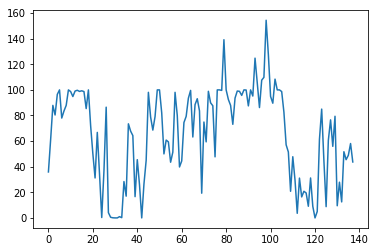

| Reward: 92 | Episode: 138 


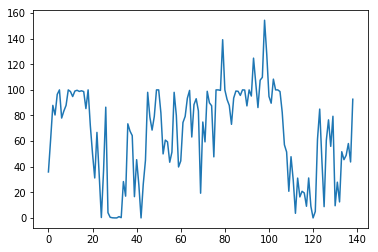

| Reward: 52 | Episode: 139 


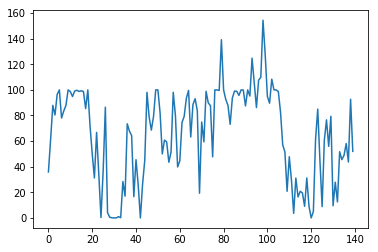

| Reward: 3 | Episode: 140 


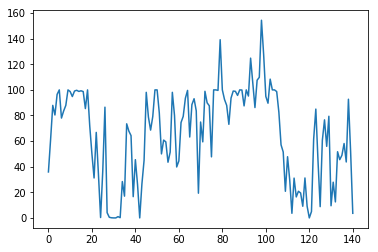

| Reward: 0 | Episode: 141 


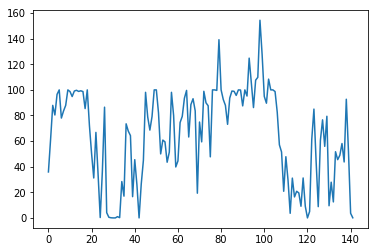

| Reward: 0 | Episode: 142 


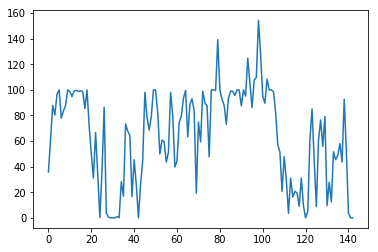

| Reward: 0 | Episode: 143 


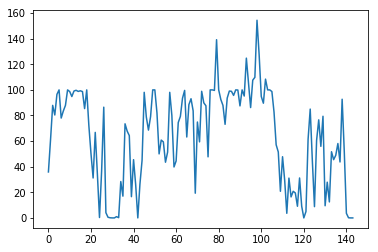

| Reward: 0 | Episode: 144 


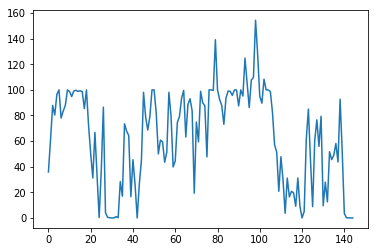

| Reward: 0 | Episode: 145 


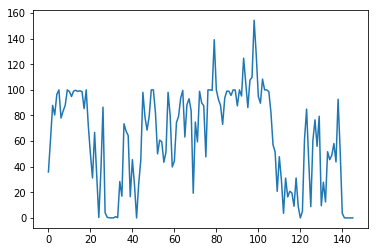

| Reward: 0 | Episode: 146 


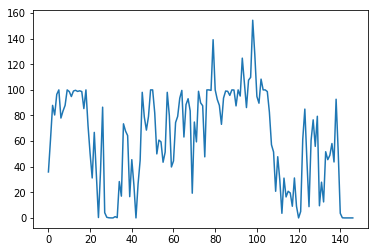

| Reward: 11 | Episode: 147 


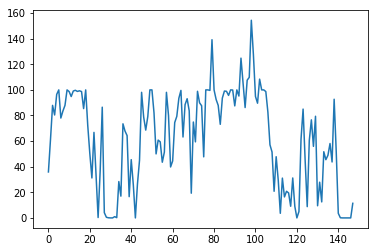

| Reward: 43 | Episode: 148 


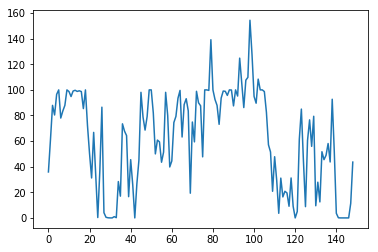

| Reward: 46 | Episode: 149 


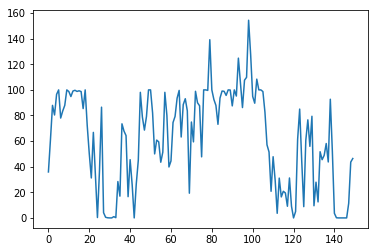

| Reward: 87 | Episode: 150 


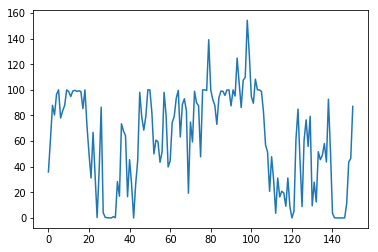

| Reward: 69 | Episode: 151 


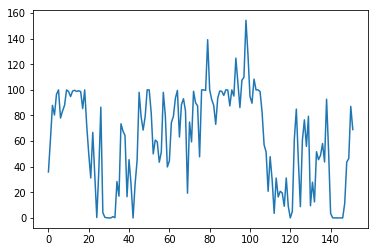

| Reward: 99 | Episode: 152 


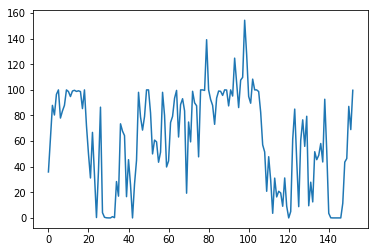

| Reward: 86 | Episode: 153 


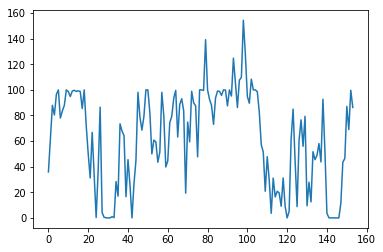

| Reward: 99 | Episode: 154 


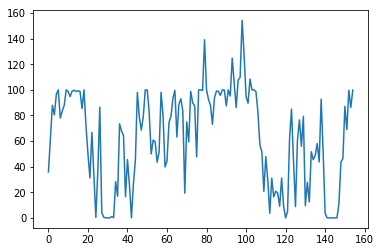

| Reward: 99 | Episode: 155 


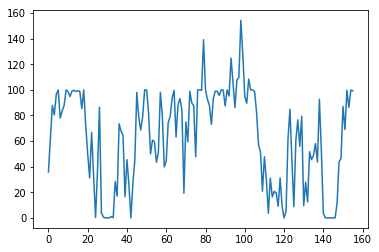

| Reward: 99 | Episode: 156 


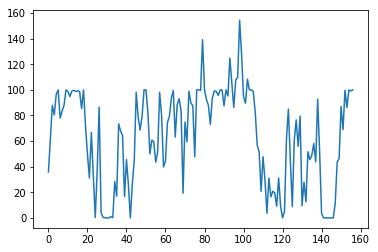

| Reward: 88 | Episode: 157 


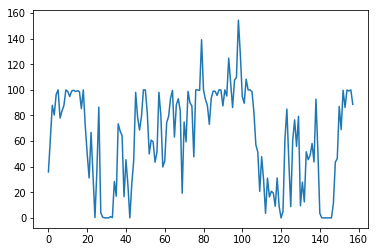

| Reward: 91 | Episode: 158 


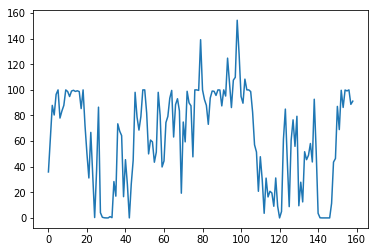

| Reward: 98 | Episode: 159 


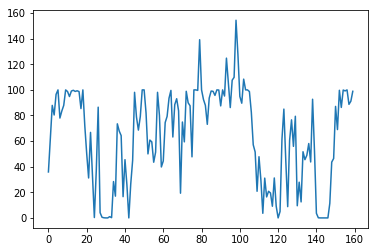

| Reward: 90 | Episode: 160 


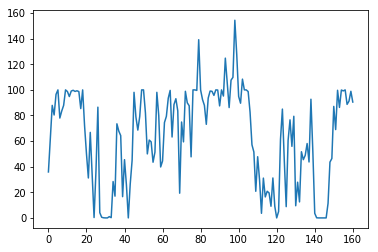

| Reward: 99 | Episode: 161 


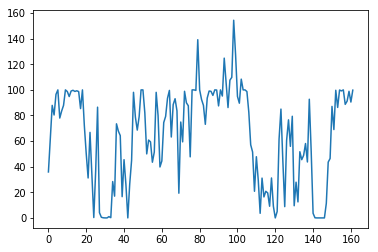

| Reward: 59 | Episode: 162 


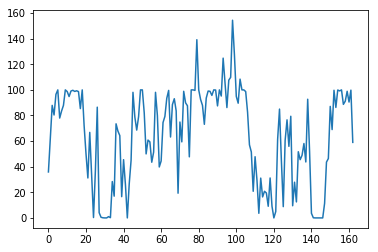

| Reward: 68 | Episode: 163 


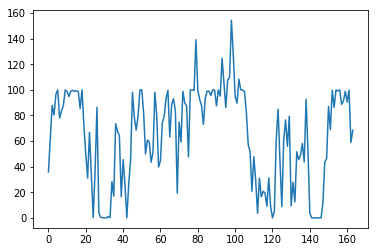

| Reward: 116 | Episode: 164 


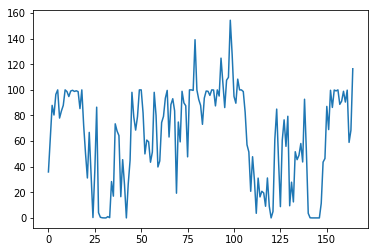

| Reward: 87 | Episode: 165 


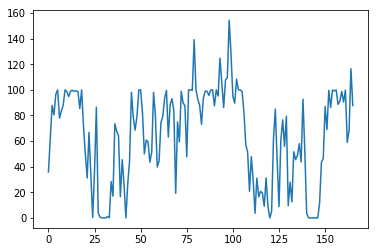

| Reward: 81 | Episode: 166 


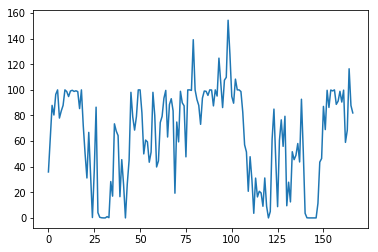

| Reward: 72 | Episode: 167 


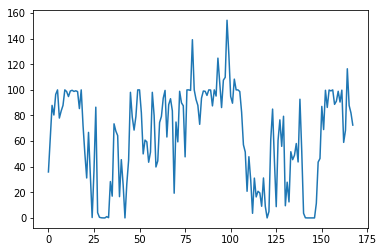

| Reward: 77 | Episode: 168 


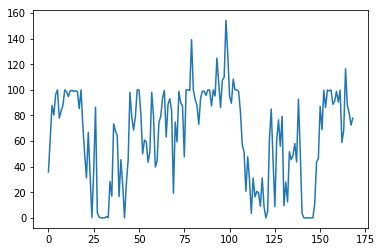

| Reward: 111 | Episode: 169 


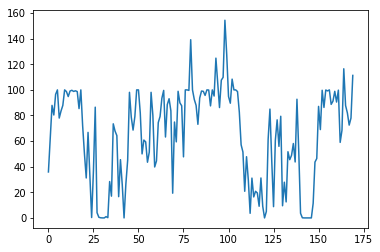

| Reward: 93 | Episode: 170 


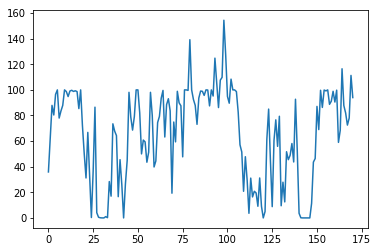

| Reward: 49 | Episode: 171 


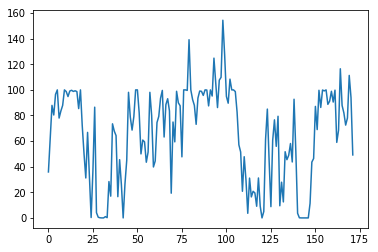

| Reward: 73 | Episode: 172 


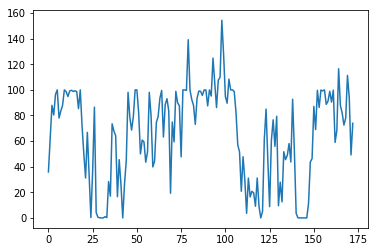

| Reward: 66 | Episode: 173 


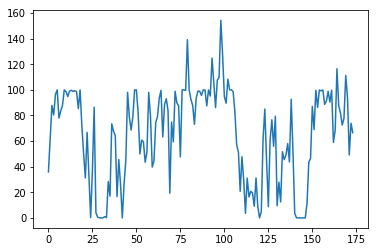

| Reward: 67 | Episode: 174 


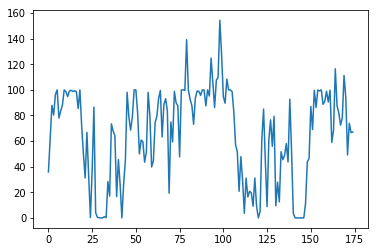

| Reward: 71 | Episode: 175 


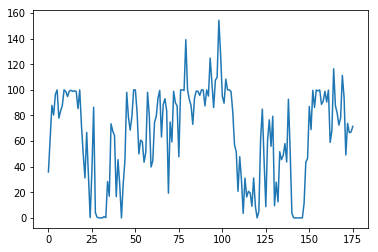

| Reward: 75 | Episode: 176 


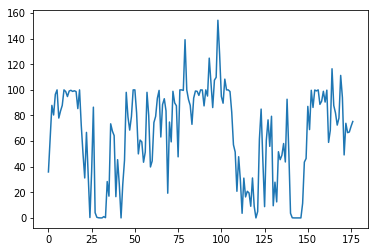

| Reward: 66 | Episode: 177 


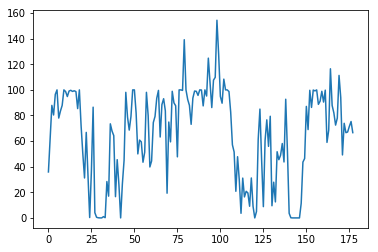

| Reward: 33 | Episode: 178 


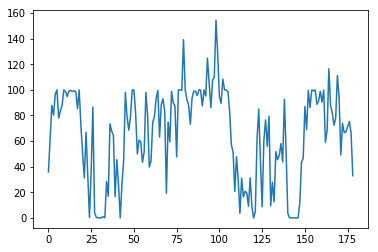

| Reward: 37 | Episode: 179 


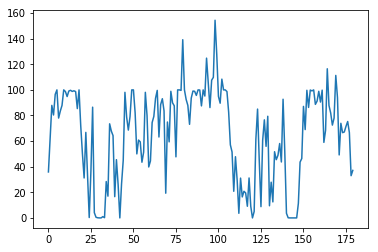

| Reward: 52 | Episode: 180 


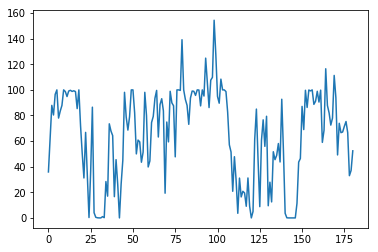

| Reward: 41 | Episode: 181 


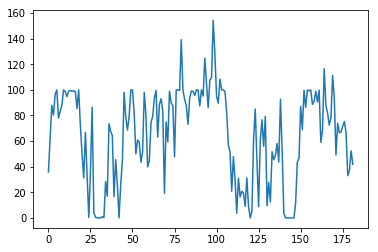

| Reward: 24 | Episode: 182 


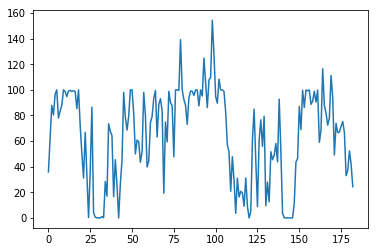

| Reward: 49 | Episode: 183 


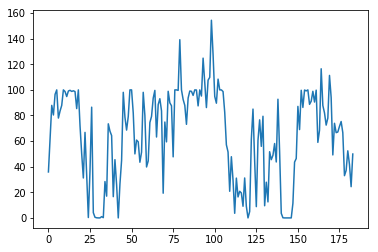

| Reward: 81 | Episode: 184 


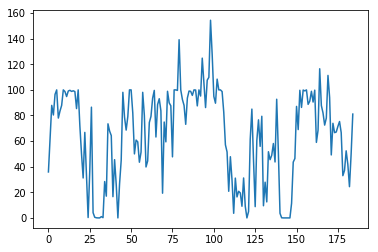

| Reward: 41 | Episode: 185 


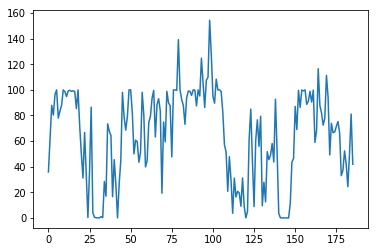

| Reward: 86 | Episode: 186 


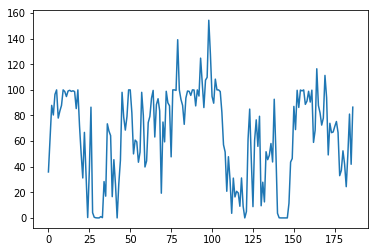

| Reward: 74 | Episode: 187 


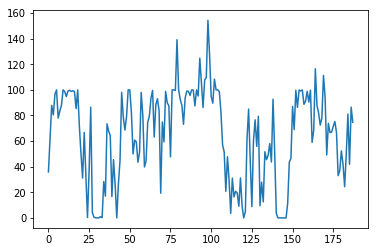

| Reward: 78 | Episode: 188 


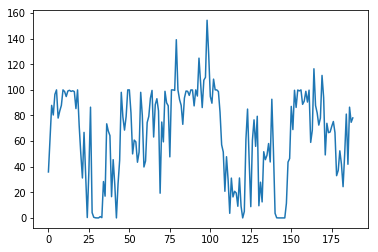

| Reward: 94 | Episode: 189 


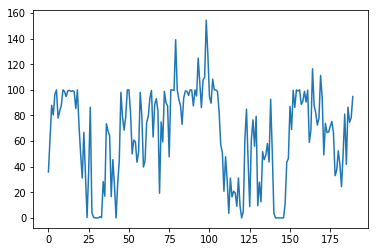

| Reward: 57 | Episode: 190 


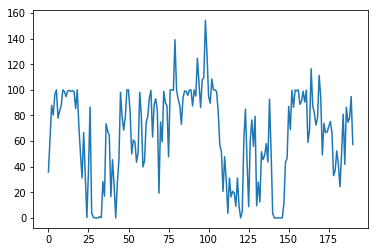

| Reward: 72 | Episode: 191 


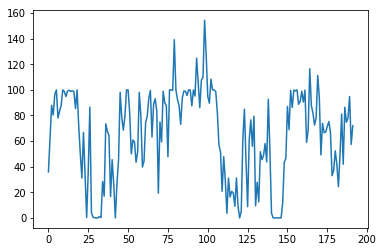

| Reward: 80 | Episode: 192 


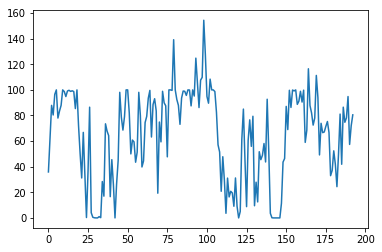

| Reward: 99 | Episode: 193 


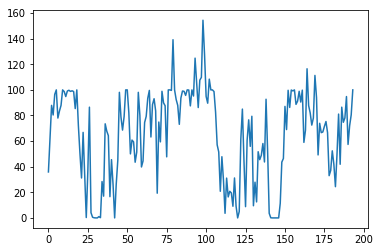

| Reward: 79 | Episode: 194 


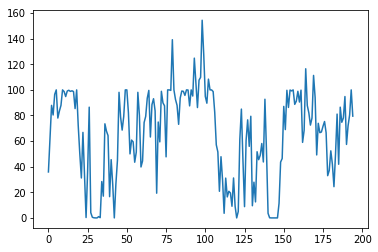

| Reward: 76 | Episode: 195 


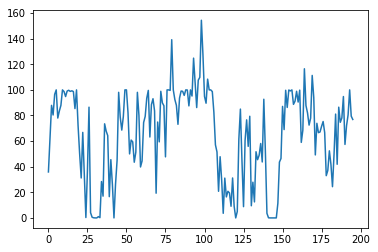

| Reward: 61 | Episode: 196 


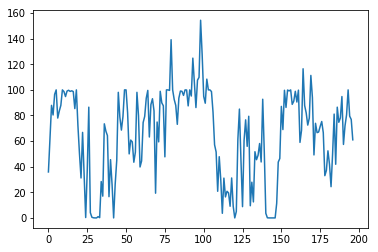

| Reward: 72 | Episode: 197 


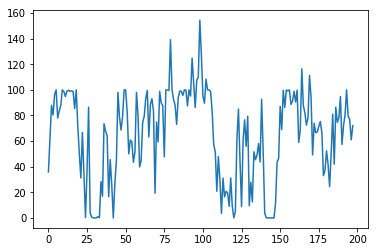

| Reward: 85 | Episode: 198 


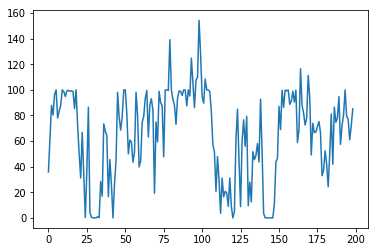

| Reward: 93 | Episode: 199 


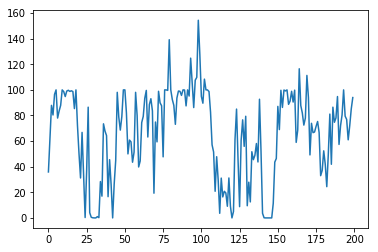

| Reward: 67 | Episode: 200 


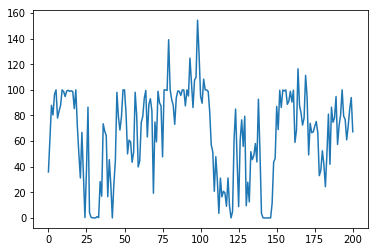

| Reward: 76 | Episode: 201 


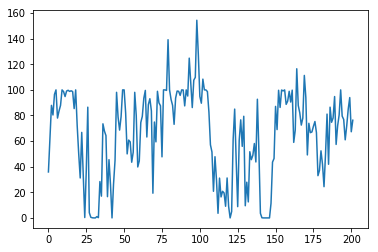

| Reward: 68 | Episode: 202 


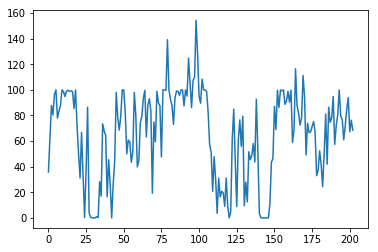

| Reward: 93 | Episode: 203 


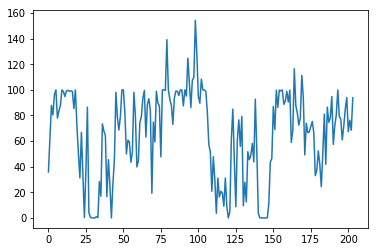

| Reward: 95 | Episode: 204 


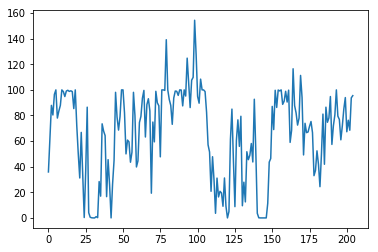

| Reward: 77 | Episode: 205 


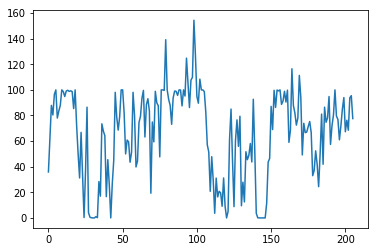

| Reward: 90 | Episode: 206 


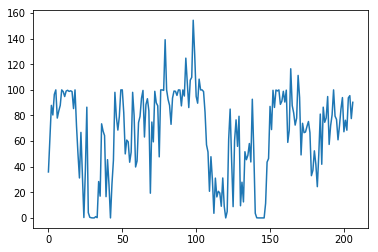

| Reward: 86 | Episode: 207 


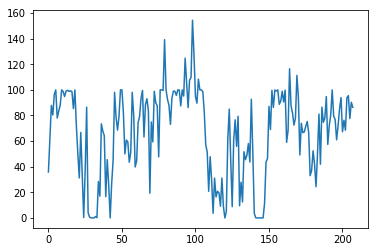

| Reward: 50 | Episode: 208 


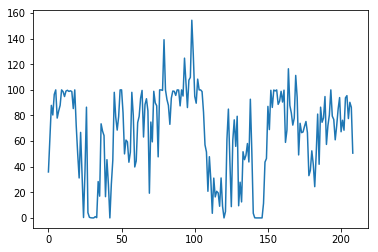

| Reward: 29 | Episode: 209 


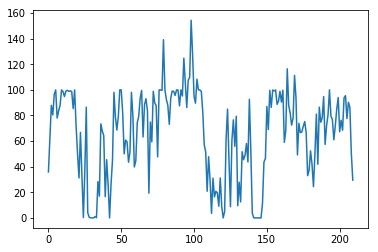

| Reward: 63 | Episode: 210 


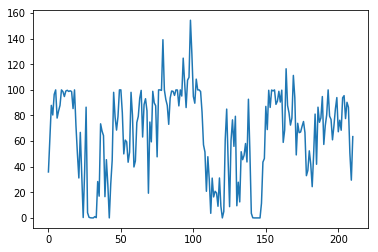

| Reward: 73 | Episode: 211 


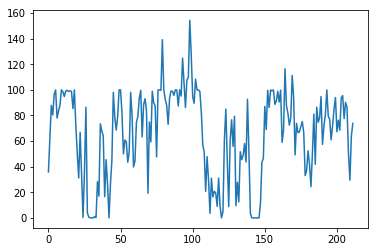

| Reward: 60 | Episode: 212 


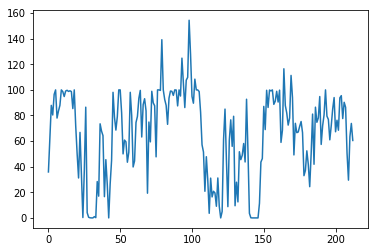

| Reward: 68 | Episode: 213 


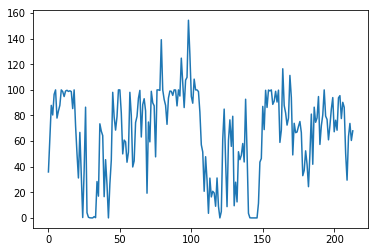

| Reward: 59 | Episode: 214 


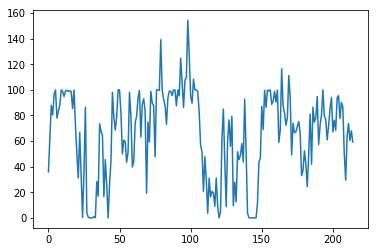

| Reward: 66 | Episode: 215 


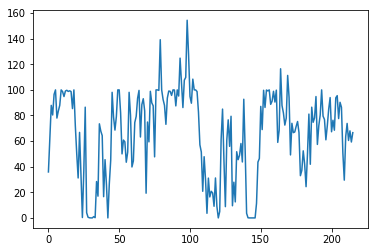

| Reward: 80 | Episode: 216 


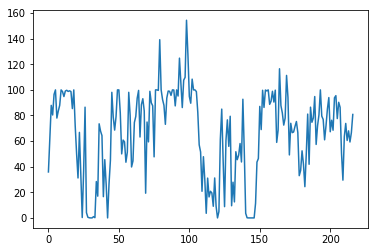

| Reward: 76 | Episode: 217 


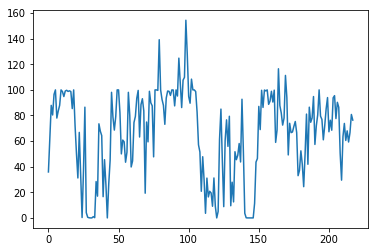

| Reward: 81 | Episode: 218 


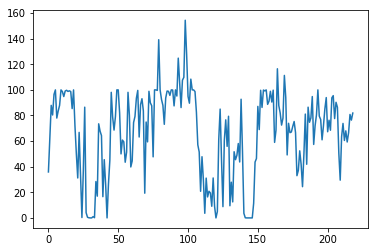

| Reward: 52 | Episode: 219 


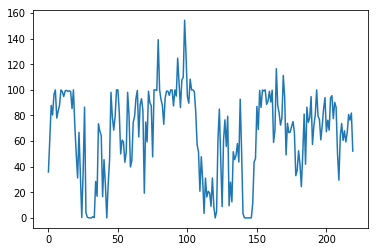

| Reward: 70 | Episode: 220 


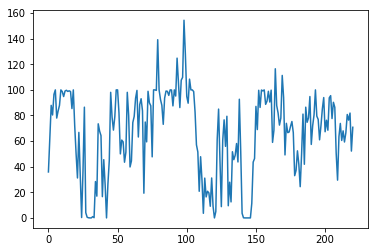

| Reward: 83 | Episode: 221 


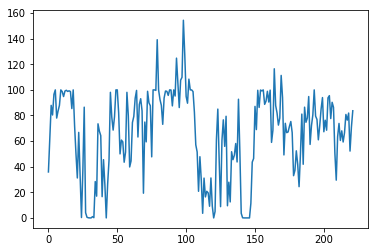

| Reward: 91 | Episode: 222 


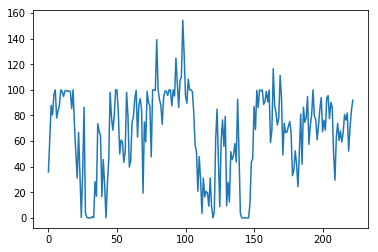

| Reward: 63 | Episode: 223 


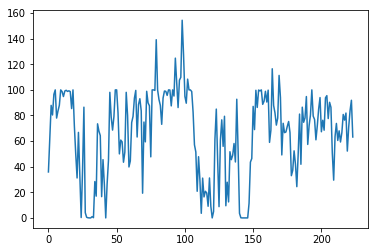

| Reward: 70 | Episode: 224 


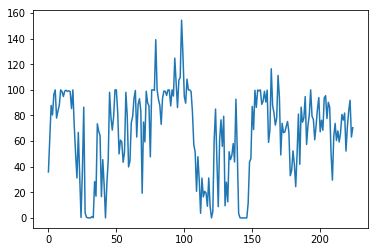

| Reward: 57 | Episode: 225 


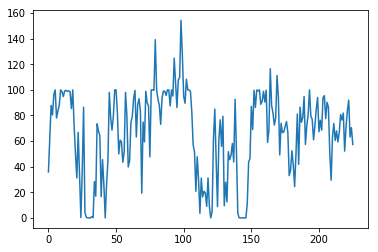

| Reward: 47 | Episode: 226 


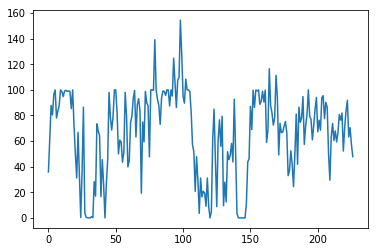

| Reward: 76 | Episode: 227 


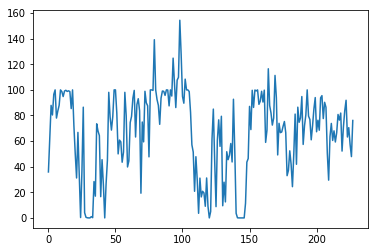

| Reward: 44 | Episode: 228 


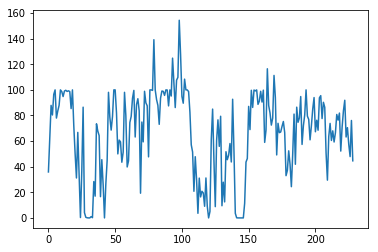

| Reward: 61 | Episode: 229 


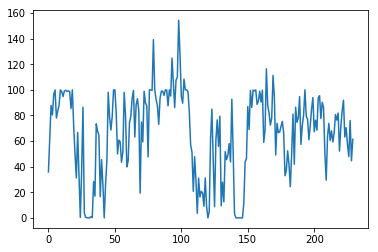

| Reward: 49 | Episode: 230 


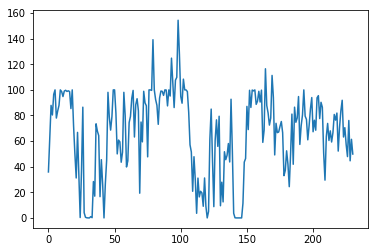

| Reward: 37 | Episode: 231 


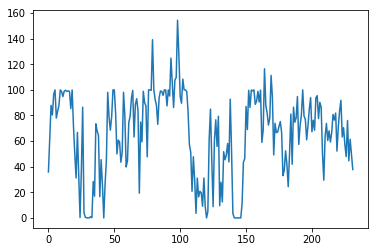

| Reward: 27 | Episode: 232 


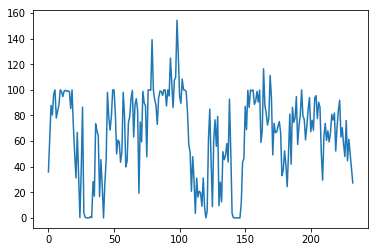

| Reward: 49 | Episode: 233 


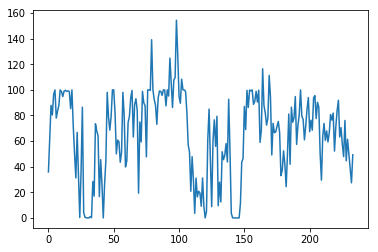

| Reward: 41 | Episode: 234 


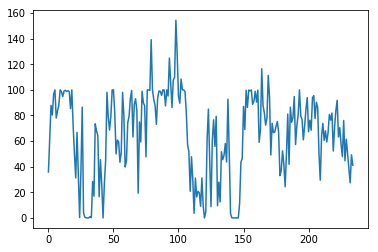

| Reward: 31 | Episode: 235 


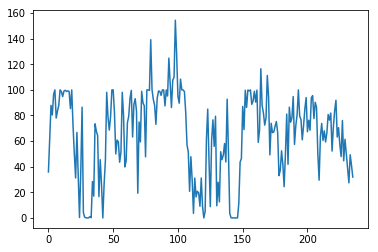

| Reward: 82 | Episode: 236 


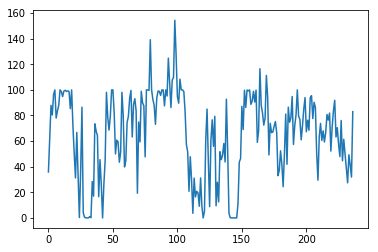

| Reward: 81 | Episode: 237 


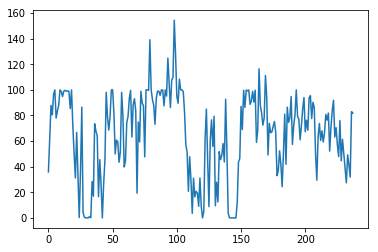

| Reward: 87 | Episode: 238 


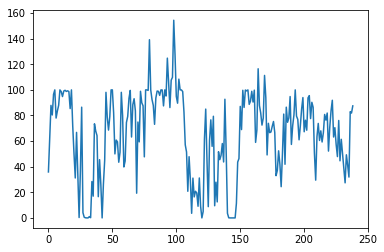

| Reward: 93 | Episode: 239 


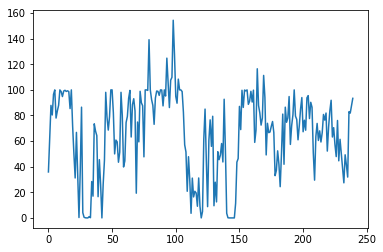

| Reward: 67 | Episode: 240 


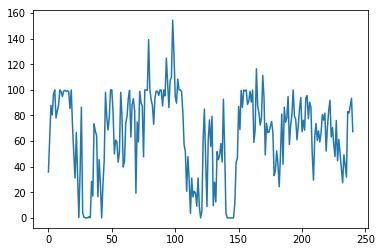

| Reward: 87 | Episode: 241 


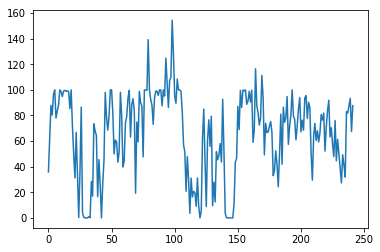

| Reward: 61 | Episode: 242 


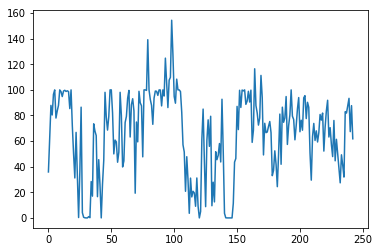

| Reward: 70 | Episode: 243 


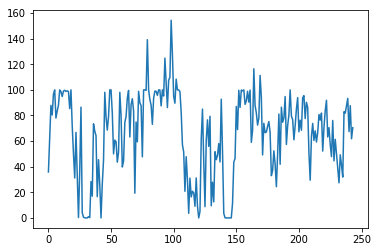

| Reward: 58 | Episode: 244 


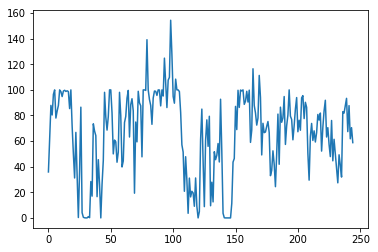

| Reward: 94 | Episode: 245 


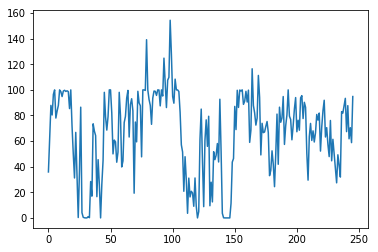

| Reward: 82 | Episode: 246 


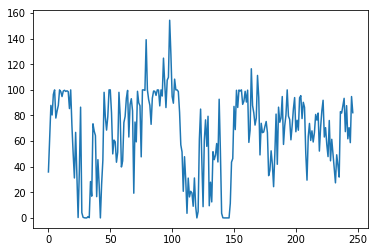

| Reward: 62 | Episode: 247 


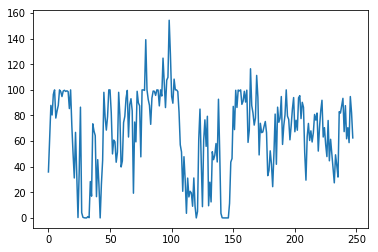

| Reward: 47 | Episode: 248 


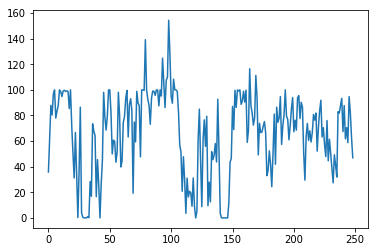

| Reward: 77 | Episode: 249 


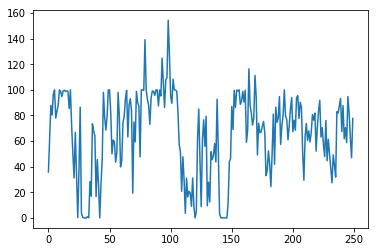

| Reward: 72 | Episode: 250 


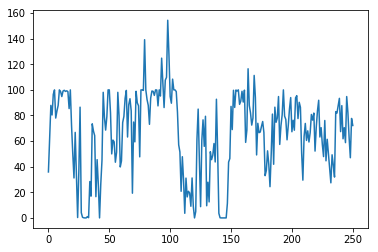

| Reward: 83 | Episode: 251 


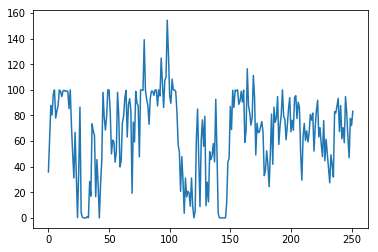

| Reward: 72 | Episode: 252 


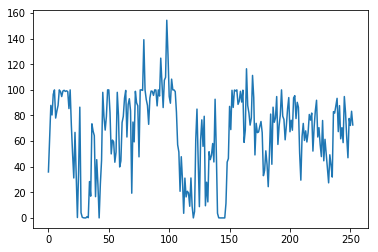

| Reward: 68 | Episode: 253 


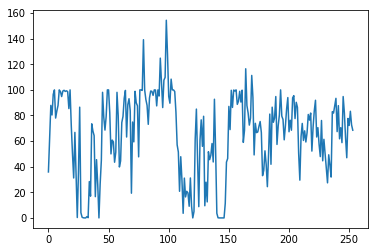

| Reward: 95 | Episode: 254 


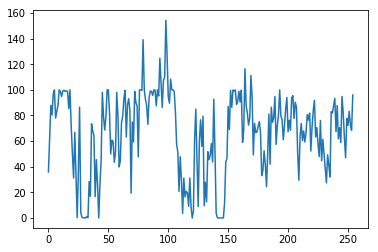

| Reward: 97 | Episode: 255 


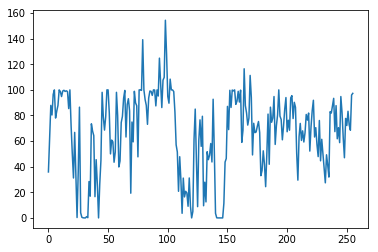

| Reward: 78 | Episode: 256 


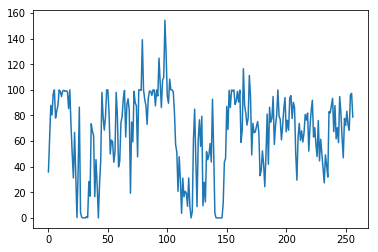

| Reward: 82 | Episode: 257 


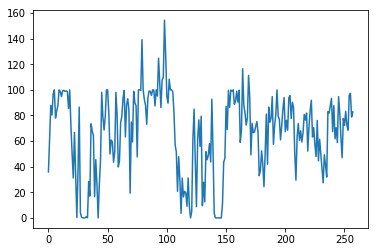

| Reward: 99 | Episode: 258 


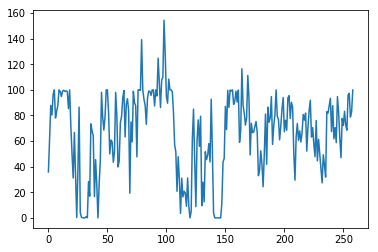

| Reward: 91 | Episode: 259 


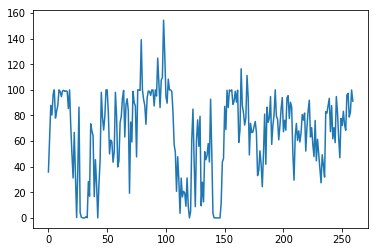

| Reward: 83 | Episode: 260 


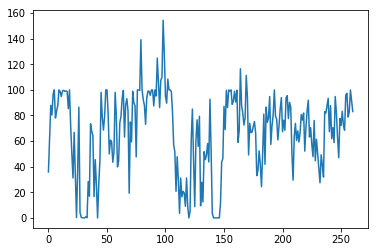

| Reward: 84 | Episode: 261 


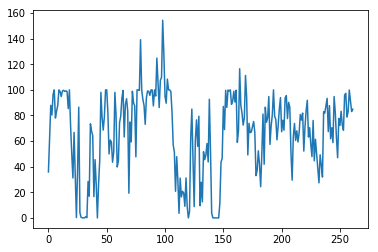

| Reward: 61 | Episode: 262 


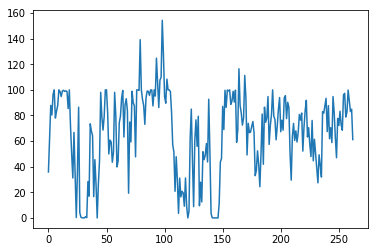

| Reward: 101 | Episode: 263 


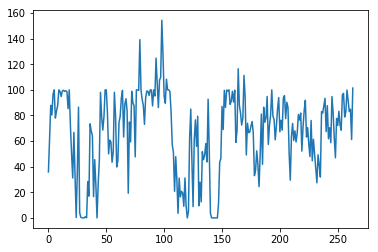

| Reward: 158 | Episode: 264 


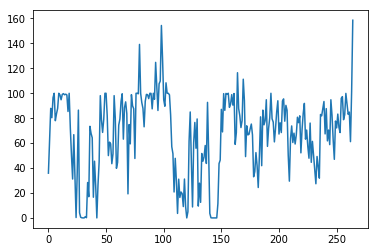

| Reward: 120 | Episode: 265 


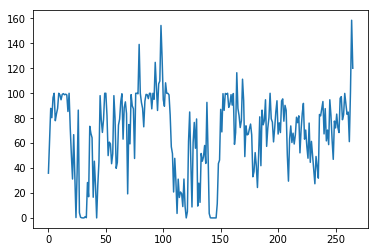

| Reward: 96 | Episode: 266 


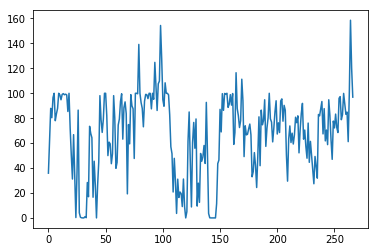

| Reward: 129 | Episode: 267 


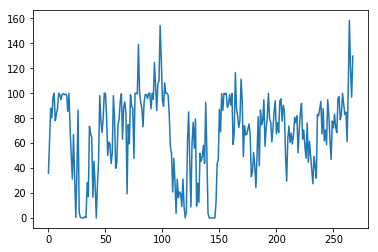

| Reward: 106 | Episode: 268 


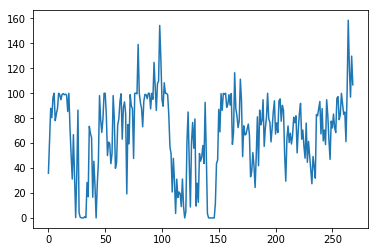

| Reward: 99 | Episode: 269 


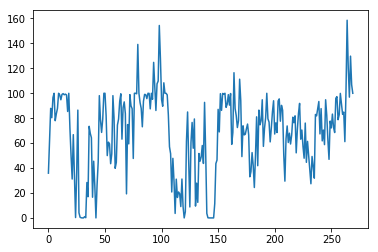

| Reward: 99 | Episode: 270 


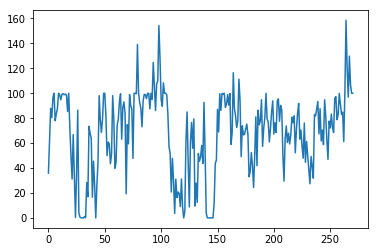

| Reward: 104 | Episode: 271 


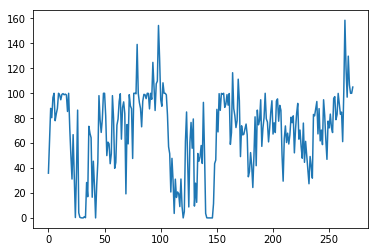

| Reward: 110 | Episode: 272 


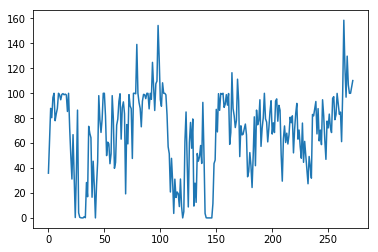

| Reward: 101 | Episode: 273 


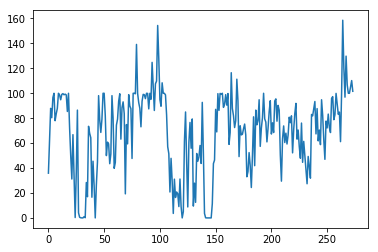

| Reward: 100 | Episode: 274 


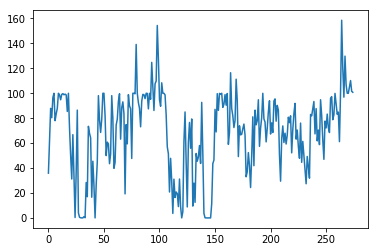

| Reward: 230 | Episode: 275 


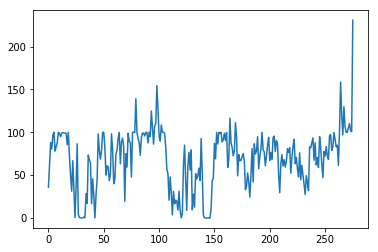

| Reward: 113 | Episode: 276 


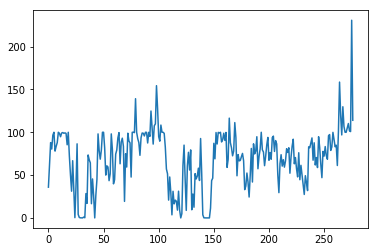

| Reward: 99 | Episode: 277 


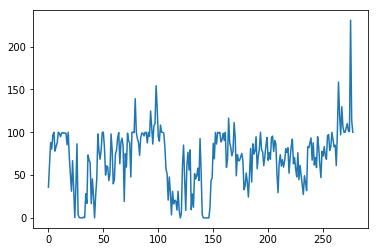

| Reward: 103 | Episode: 278 


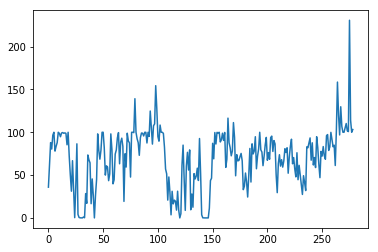

| Reward: 112 | Episode: 279 


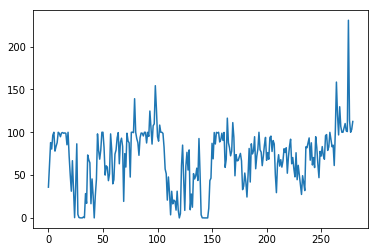

| Reward: 125 | Episode: 280 


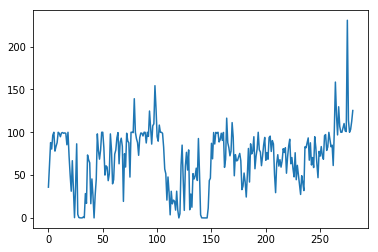

| Reward: 124 | Episode: 281 


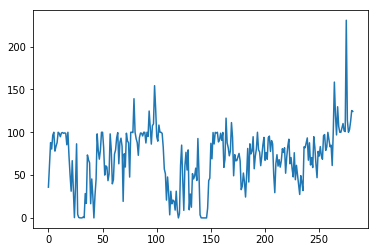

| Reward: 100 | Episode: 282 


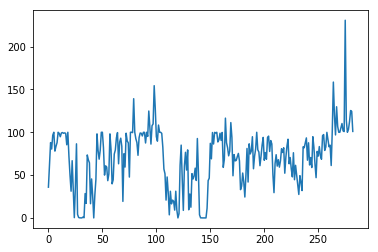

| Reward: 108 | Episode: 283 


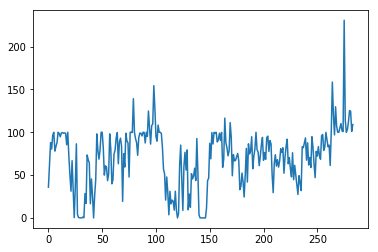

| Reward: 99 | Episode: 284 


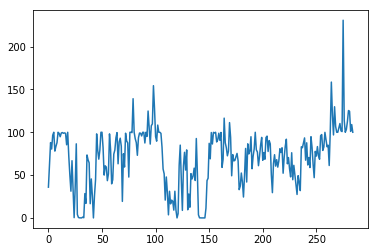

| Reward: 118 | Episode: 285 


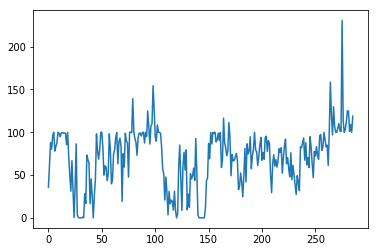

| Reward: 154 | Episode: 286 


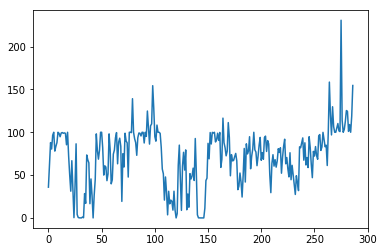

| Reward: 102 | Episode: 287 


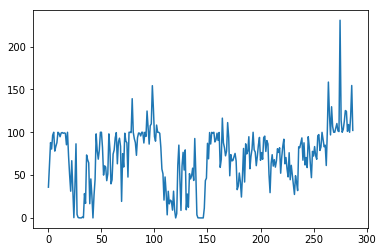

| Reward: 106 | Episode: 288 


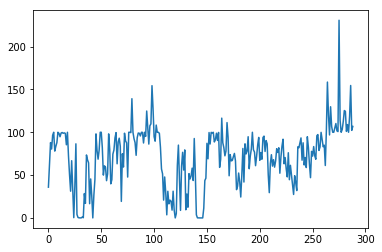

| Reward: 99 | Episode: 289 


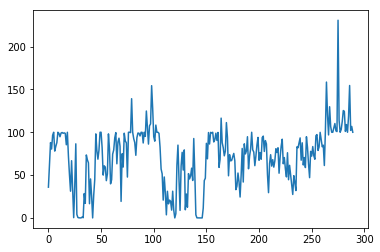

| Reward: 99 | Episode: 290 


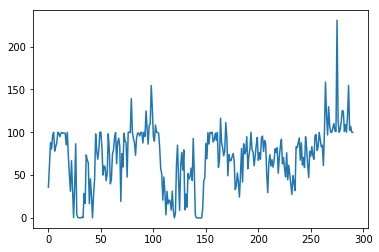

| Reward: 95 | Episode: 291 


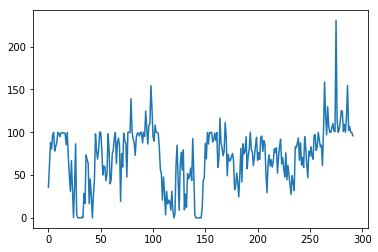

| Reward: 106 | Episode: 292 


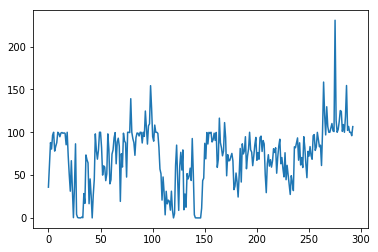

| Reward: 107 | Episode: 293 


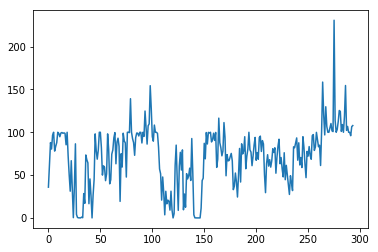

| Reward: 89 | Episode: 294 


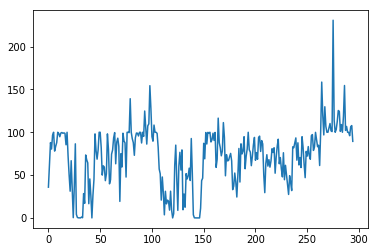

| Reward: 97 | Episode: 295 


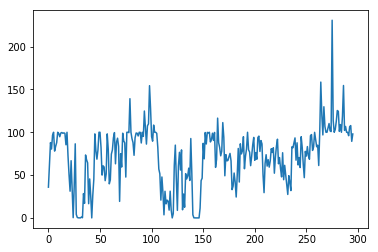

| Reward: 96 | Episode: 296 


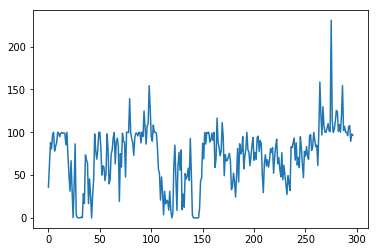

| Reward: 109 | Episode: 297 


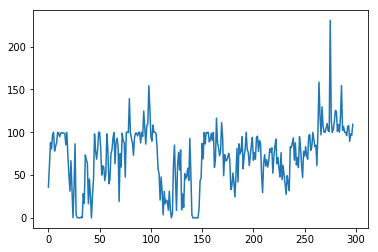

| Reward: 122 | Episode: 298 


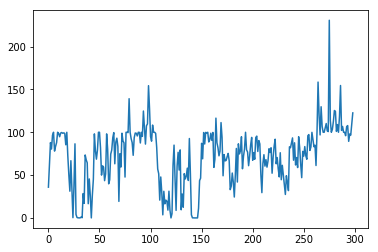

| Reward: 99 | Episode: 299 


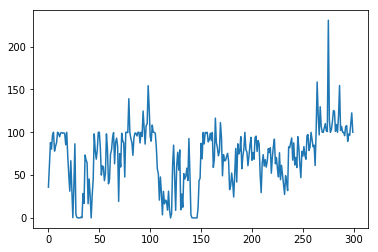

| Reward: 99 | Episode: 300 


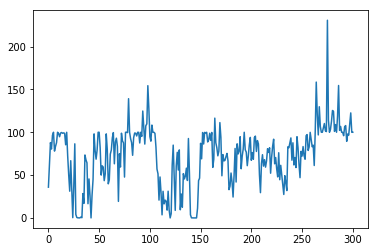

| Reward: 113 | Episode: 301 


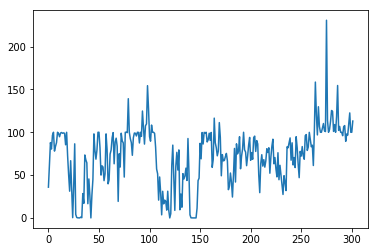

| Reward: 100 | Episode: 302 


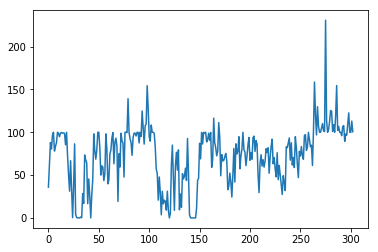

| Reward: 185 | Episode: 303 


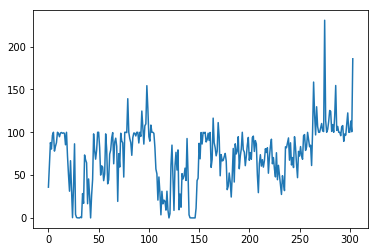

| Reward: 99 | Episode: 304 


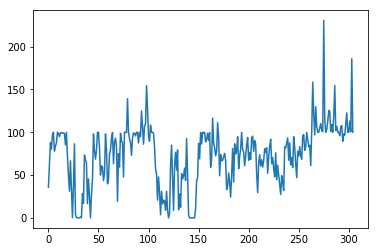

| Reward: 99 | Episode: 305 


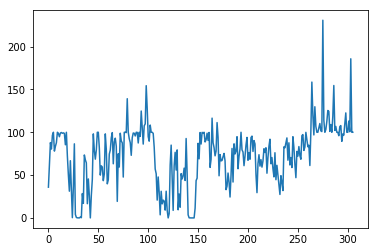

| Reward: 139 | Episode: 306 


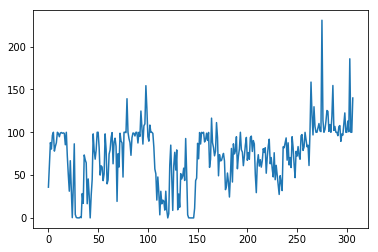

| Reward: 107 | Episode: 307 


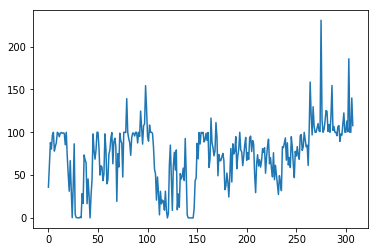

| Reward: 98 | Episode: 308 


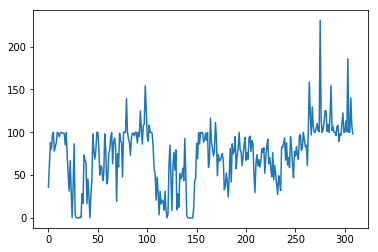

| Reward: 117 | Episode: 309 


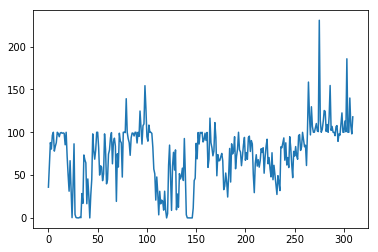

| Reward: 109 | Episode: 310 


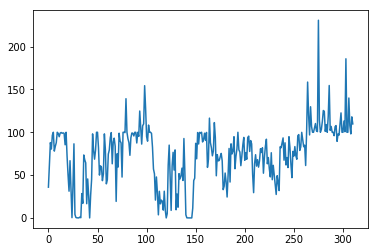

| Reward: 169 | Episode: 311 


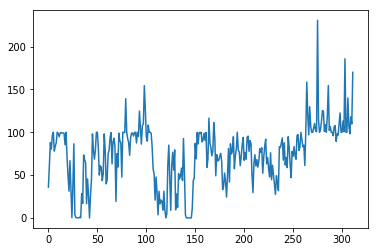

| Reward: 169 | Episode: 312 


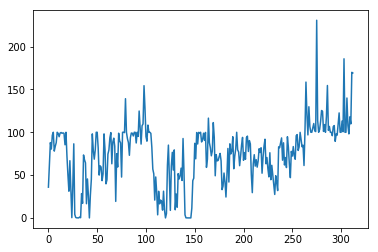

| Reward: 142 | Episode: 313 


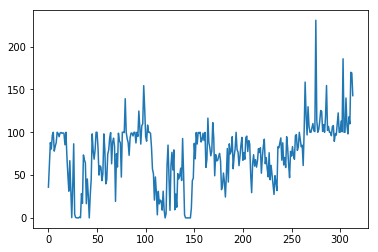

| Reward: 168 | Episode: 314 


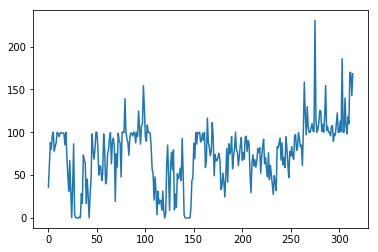

| Reward: 101 | Episode: 315 


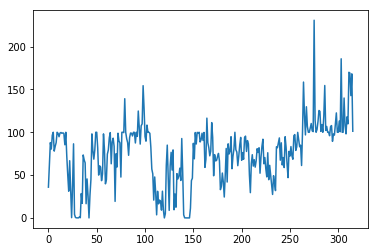

| Reward: 105 | Episode: 316 


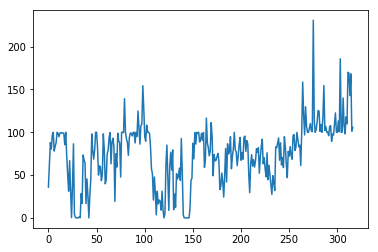

| Reward: 99 | Episode: 317 


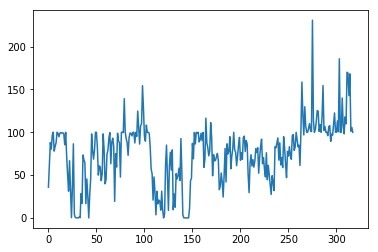

| Reward: 150 | Episode: 318 


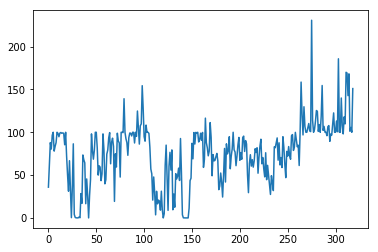

| Reward: 138 | Episode: 319 


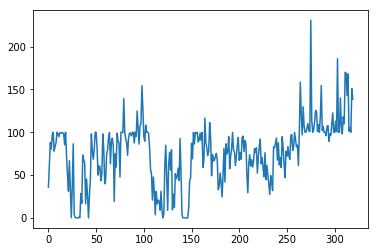

| Reward: 111 | Episode: 320 


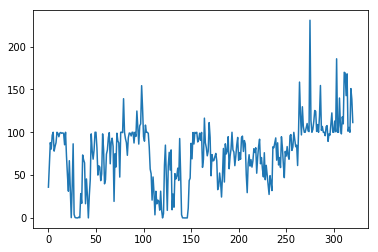

| Reward: 129 | Episode: 321 


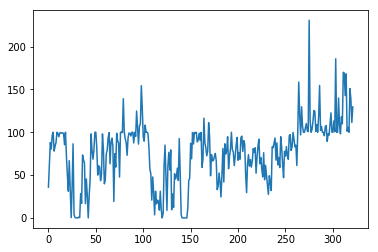

| Reward: 133 | Episode: 322 


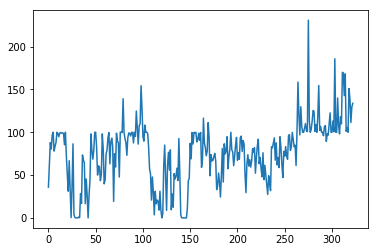

| Reward: 174 | Episode: 323 


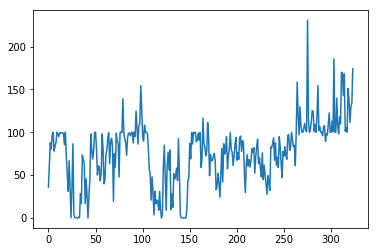

| Reward: 99 | Episode: 324 


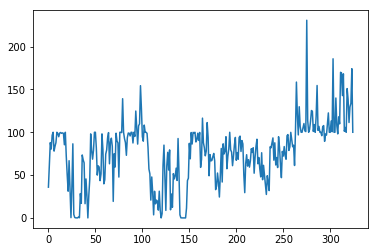

| Reward: 99 | Episode: 325 


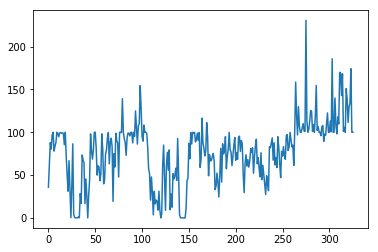

| Reward: 100 | Episode: 326 


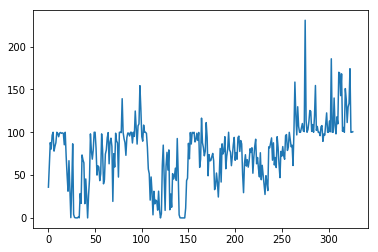

| Reward: 226 | Episode: 327 


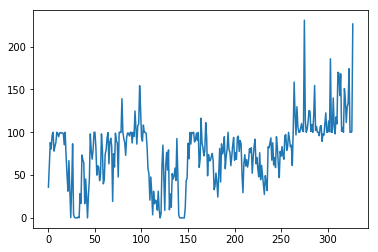

| Reward: 110 | Episode: 328 


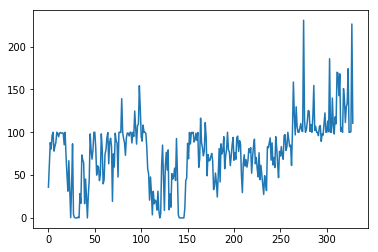

| Reward: 168 | Episode: 329 


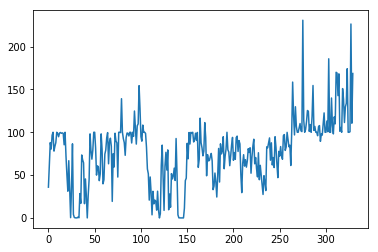

| Reward: 100 | Episode: 330 


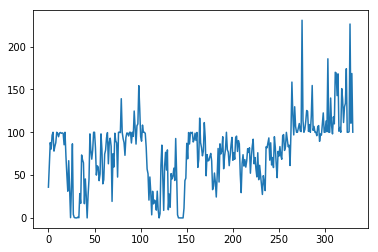

| Reward: 108 | Episode: 331 


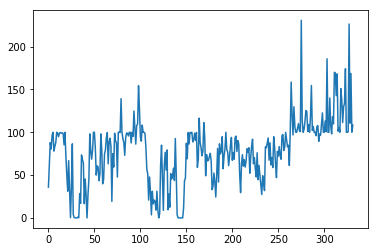

| Reward: 114 | Episode: 332 


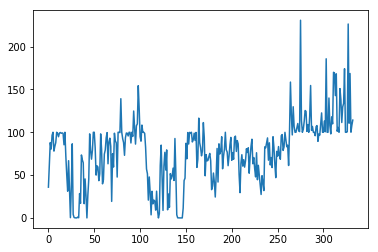

| Reward: 118 | Episode: 333 


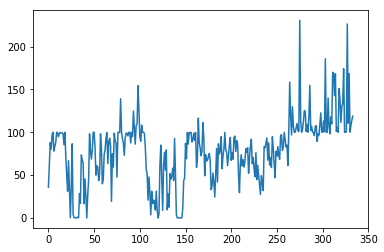

| Reward: 128 | Episode: 334 


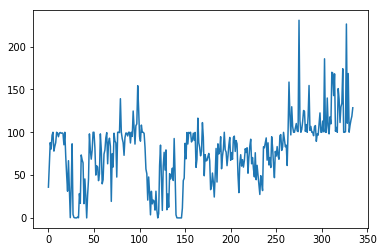

| Reward: 104 | Episode: 335 


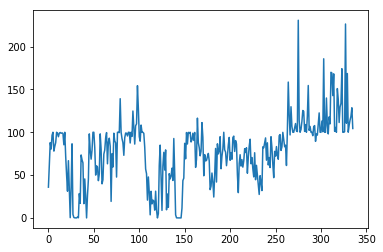

| Reward: 100 | Episode: 336 


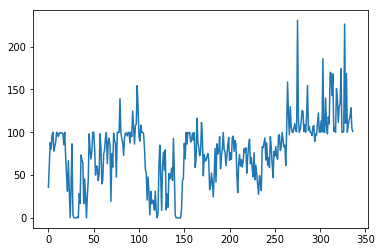

| Reward: 99 | Episode: 337 


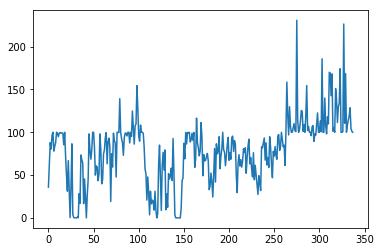

| Reward: 117 | Episode: 338 


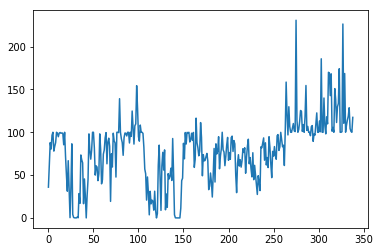

| Reward: 114 | Episode: 339 


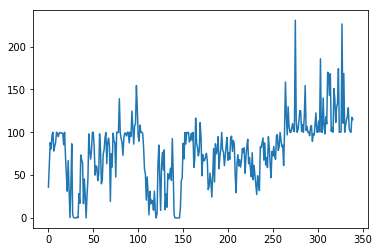

| Reward: 100 | Episode: 340 


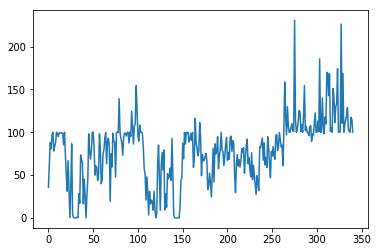

| Reward: 119 | Episode: 341 


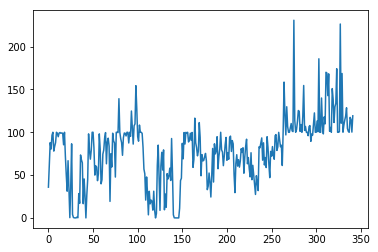

| Reward: 98 | Episode: 342 


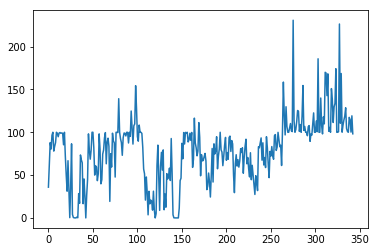

| Reward: 110 | Episode: 343 


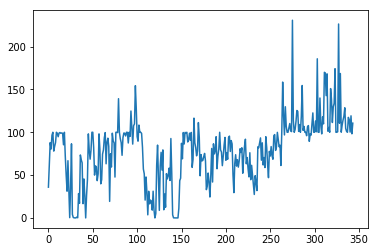

| Reward: 111 | Episode: 344 


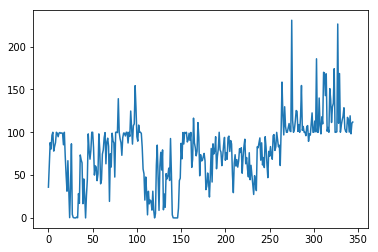

| Reward: 101 | Episode: 345 


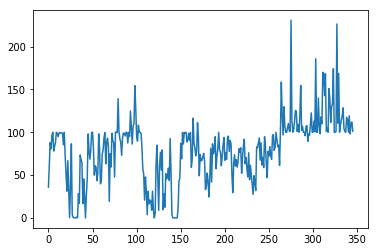

| Reward: 139 | Episode: 346 


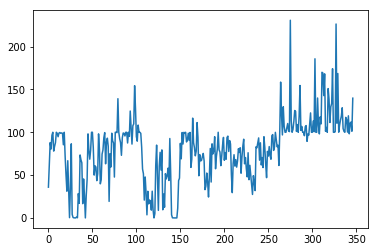

| Reward: 100 | Episode: 347 


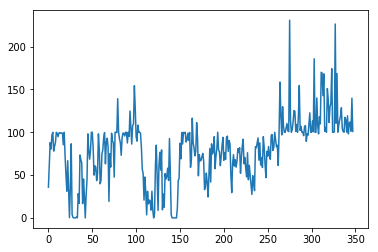

| Reward: 136 | Episode: 348 


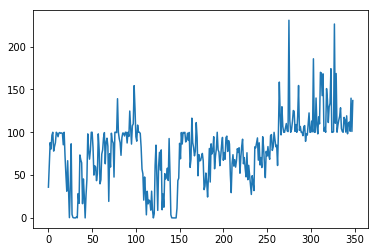

| Reward: 128 | Episode: 349 


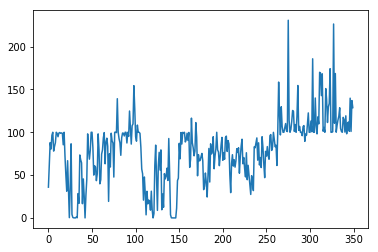

| Reward: 101 | Episode: 350 


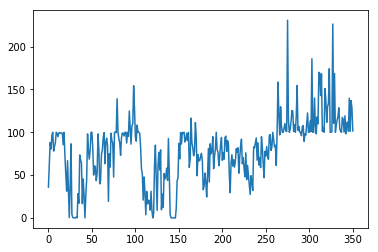

| Reward: 99 | Episode: 351 


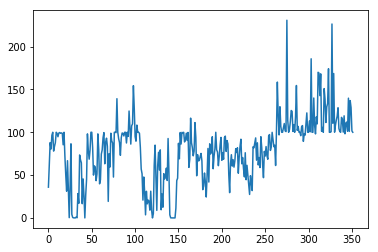

| Reward: 138 | Episode: 352 


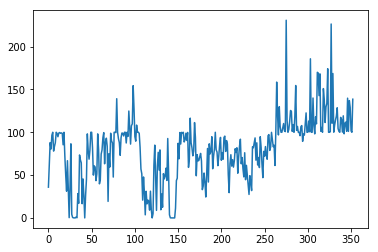

| Reward: 163 | Episode: 353 


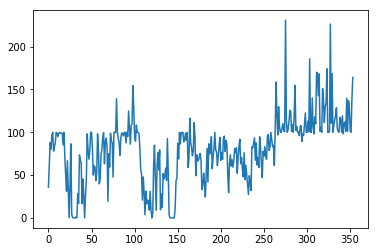

| Reward: 208 | Episode: 354 


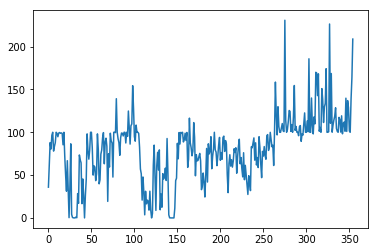

| Reward: 192 | Episode: 355 


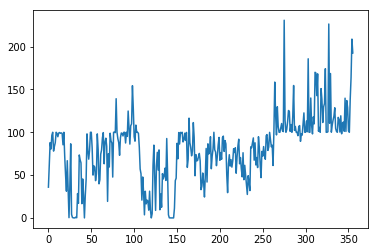

| Reward: 217 | Episode: 356 


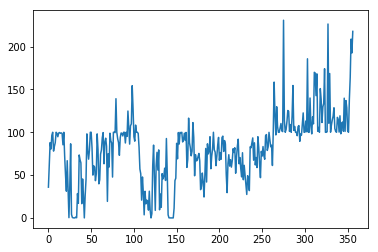

| Reward: 135 | Episode: 357 


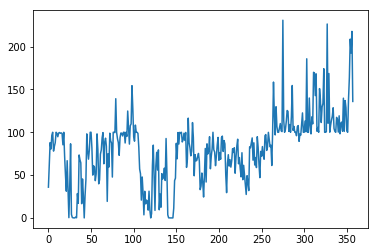

| Reward: 122 | Episode: 358 


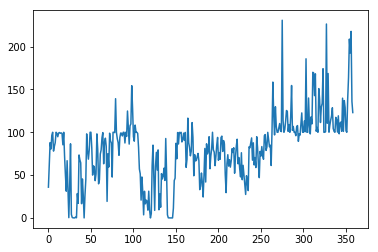

| Reward: 113 | Episode: 359 


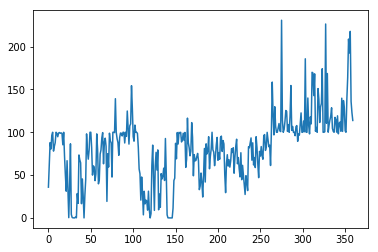

| Reward: 104 | Episode: 360 


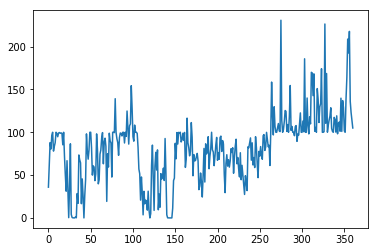

| Reward: 102 | Episode: 361 


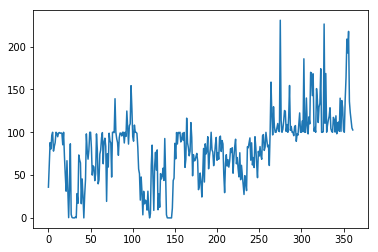

| Reward: 99 | Episode: 362 


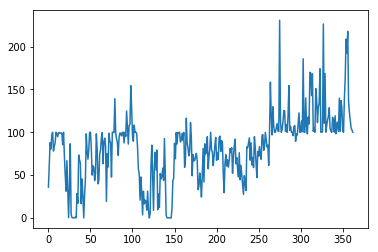

| Reward: 101 | Episode: 363 


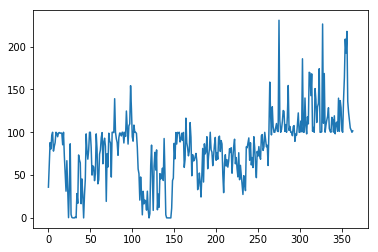

| Reward: 166 | Episode: 364 


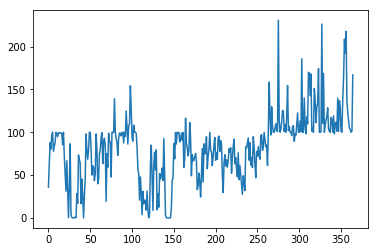

| Reward: 121 | Episode: 365 


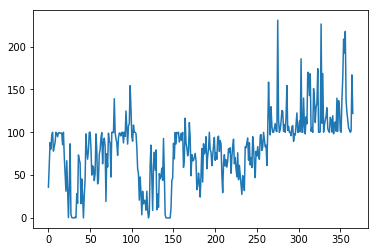

| Reward: 128 | Episode: 366 


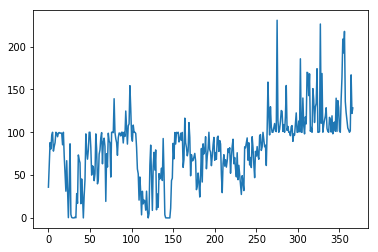

| Reward: 101 | Episode: 367 


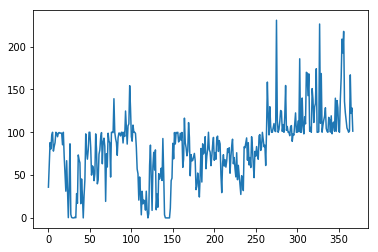

| Reward: 146 | Episode: 368 


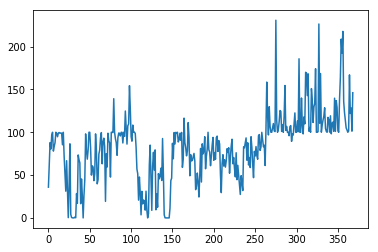

| Reward: 104 | Episode: 369 


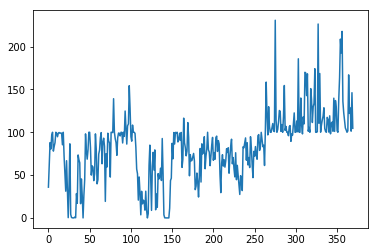

| Reward: 101 | Episode: 370 


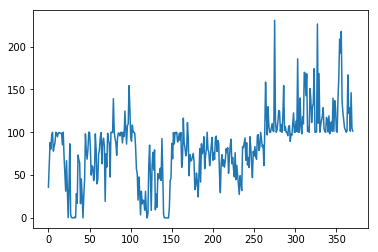

| Reward: 129 | Episode: 371 


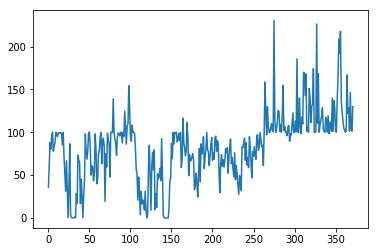

| Reward: 98 | Episode: 372 


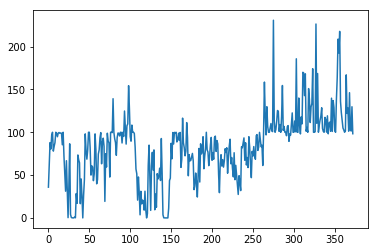

| Reward: 104 | Episode: 373 


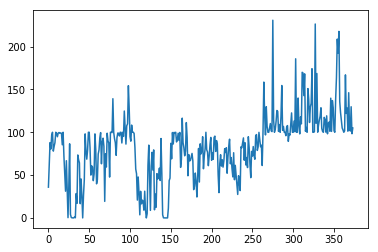

| Reward: 98 | Episode: 374 


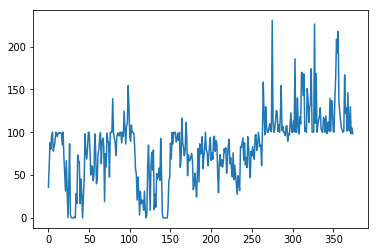

| Reward: 100 | Episode: 375 


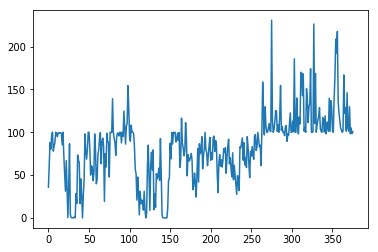

| Reward: 163 | Episode: 376 


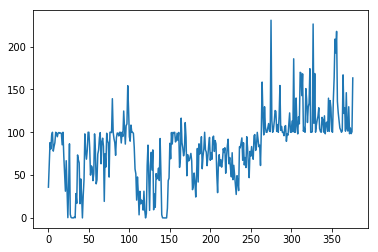

| Reward: 235 | Episode: 377 


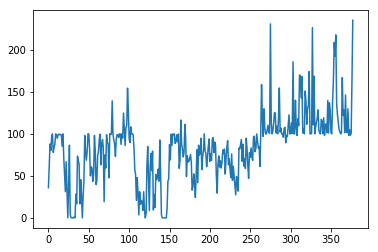

| Reward: 257 | Episode: 378 


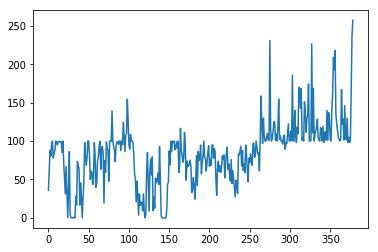

| Reward: 132 | Episode: 379 


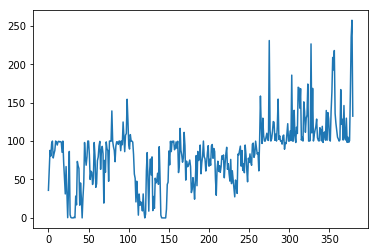

| Reward: 245 | Episode: 380 


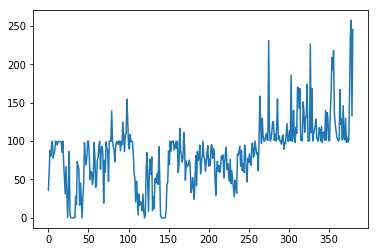

| Reward: 186 | Episode: 381 


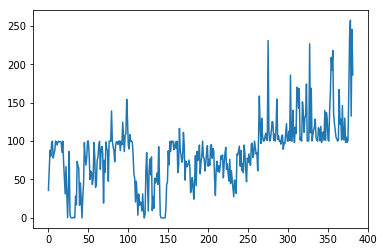

| Reward: 113 | Episode: 382 


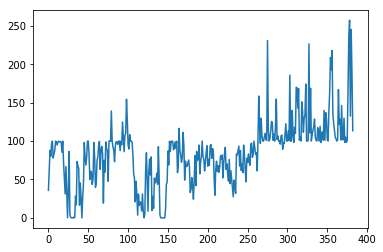

| Reward: 104 | Episode: 383 


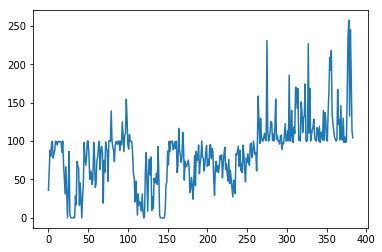

| Reward: 124 | Episode: 384 


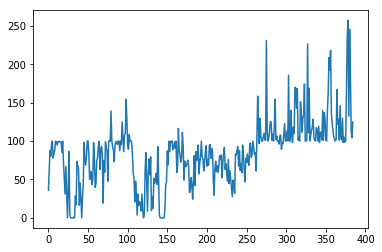

| Reward: 234 | Episode: 385 


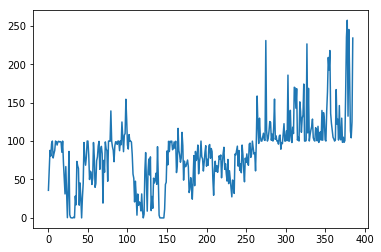

| Reward: 120 | Episode: 386 


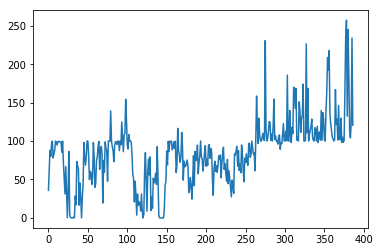

| Reward: 127 | Episode: 387 


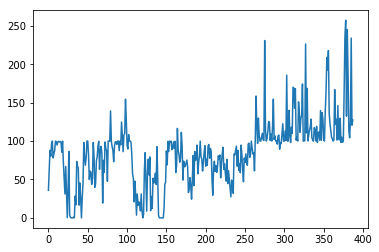

| Reward: 99 | Episode: 388 


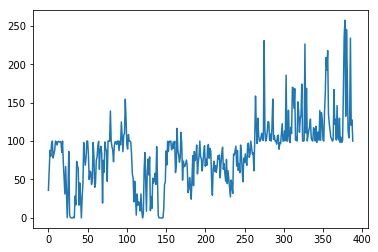

| Reward: 100 | Episode: 389 


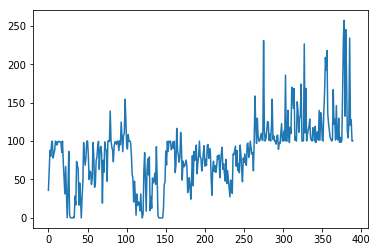

| Reward: 111 | Episode: 390 


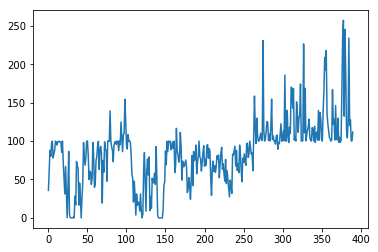

| Reward: 131 | Episode: 391 


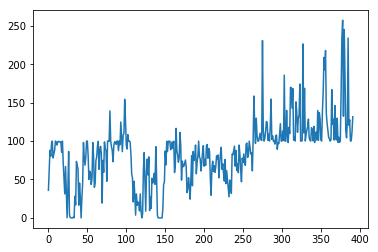

| Reward: 171 | Episode: 392 


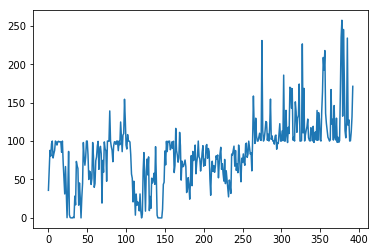

| Reward: 161 | Episode: 393 


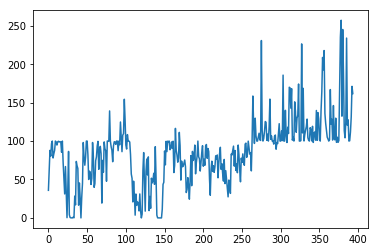

| Reward: 196 | Episode: 394 


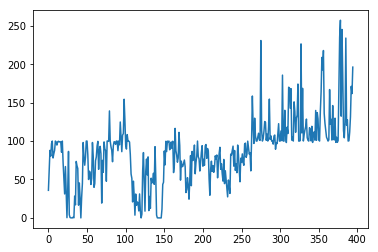

| Reward: 190 | Episode: 395 


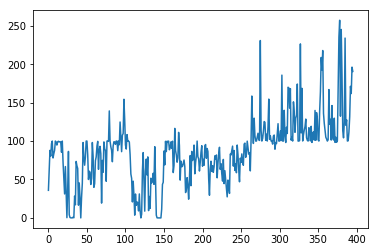

| Reward: 172 | Episode: 396 


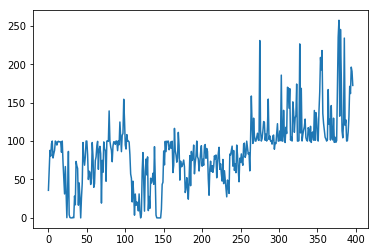

| Reward: 245 | Episode: 397 


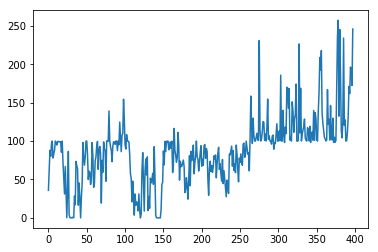

| Reward: 151 | Episode: 398 


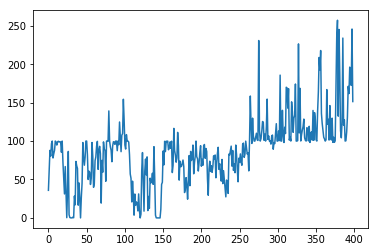

| Reward: 225 | Episode: 399 


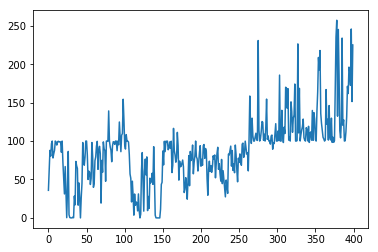

| Reward: 180 | Episode: 400 


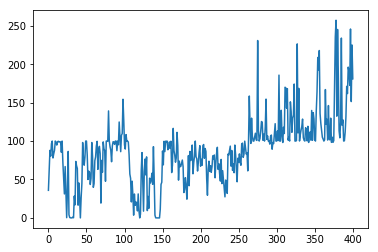

| Reward: 89 | Episode: 401 


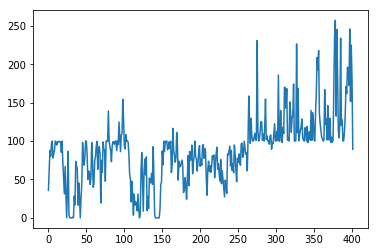

| Reward: 96 | Episode: 402 


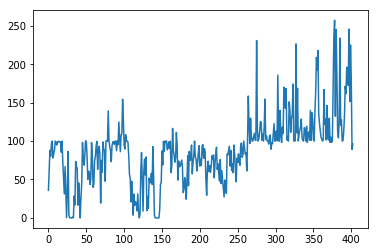

| Reward: 97 | Episode: 403 


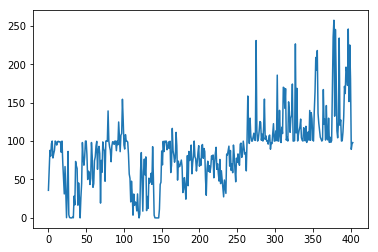

| Reward: 154 | Episode: 404 


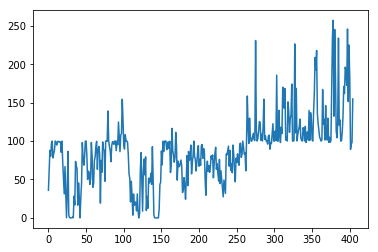

| Reward: 267 | Episode: 405 


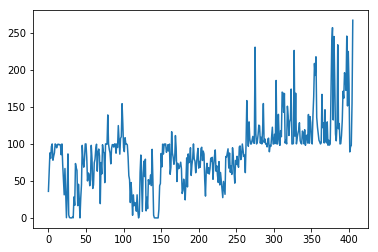

| Reward: 193 | Episode: 406 


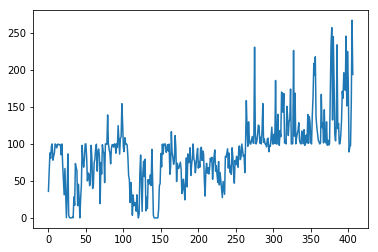

| Reward: 154 | Episode: 407 


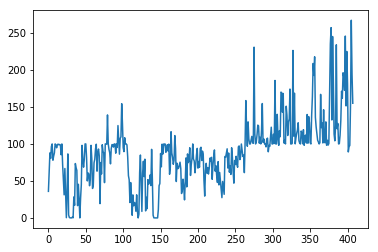

| Reward: 105 | Episode: 408 


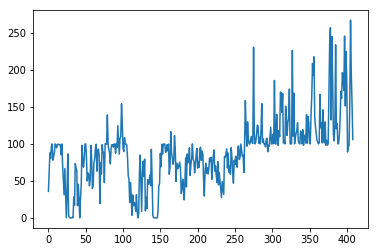

| Reward: 116 | Episode: 409 


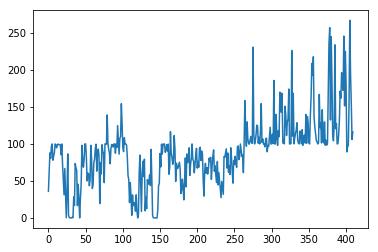

| Reward: 132 | Episode: 410 


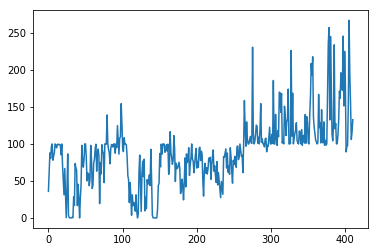

| Reward: 168 | Episode: 411 


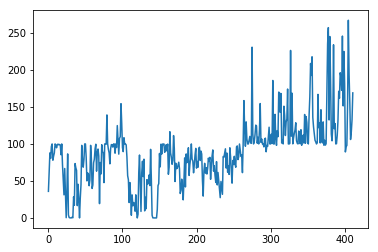

| Reward: 123 | Episode: 412 


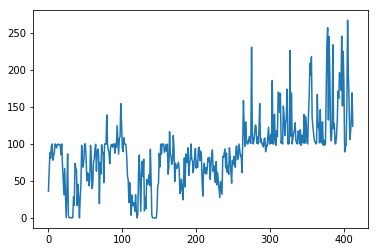

| Reward: 99 | Episode: 413 


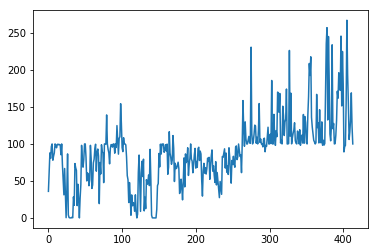

| Reward: 152 | Episode: 414 


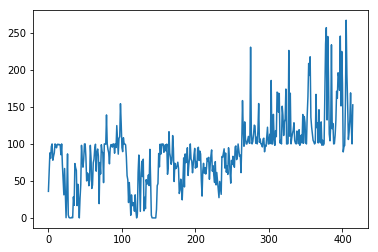

| Reward: 100 | Episode: 415 


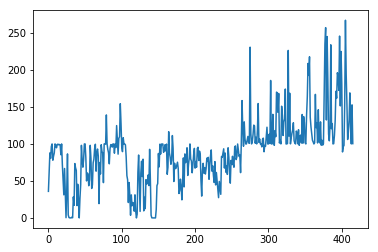

| Reward: 97 | Episode: 416 


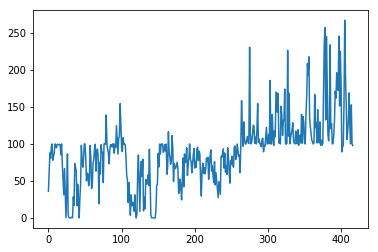

| Reward: 100 | Episode: 417 


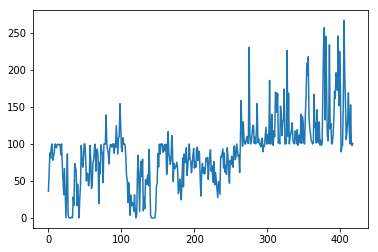

| Reward: 154 | Episode: 418 


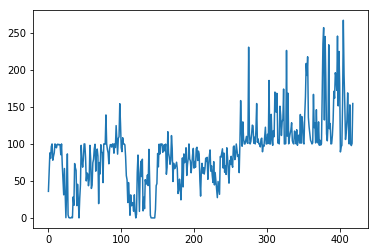

| Reward: 203 | Episode: 419 


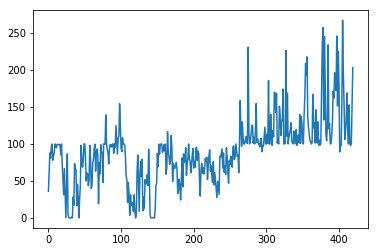

| Reward: 110 | Episode: 420 


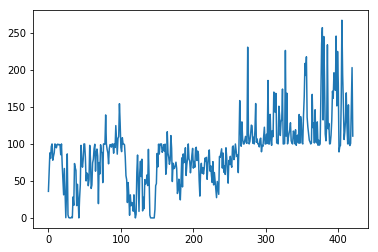

| Reward: 115 | Episode: 421 


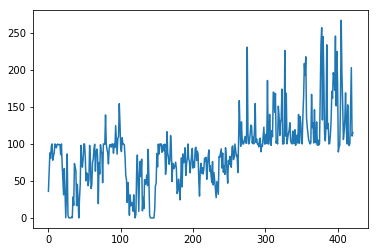

| Reward: 133 | Episode: 422 


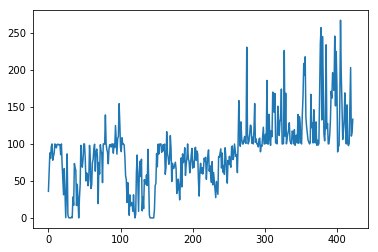

| Reward: 144 | Episode: 423 


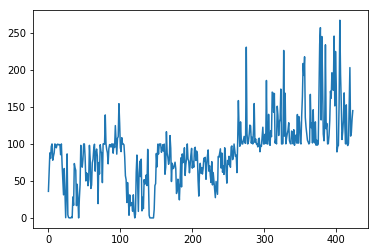

| Reward: 100 | Episode: 424 


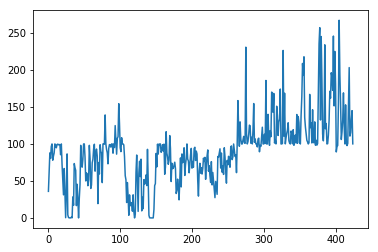

| Reward: 147 | Episode: 425 


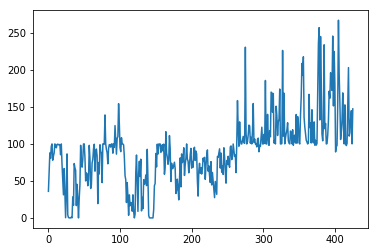

| Reward: 141 | Episode: 426 


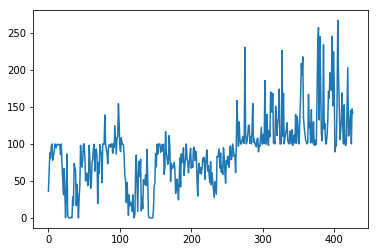

| Reward: 102 | Episode: 427 


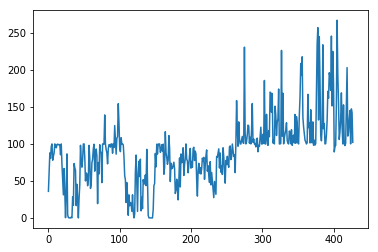

| Reward: 128 | Episode: 428 


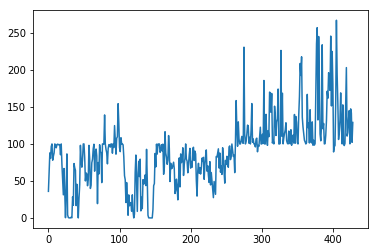

| Reward: 117 | Episode: 429 


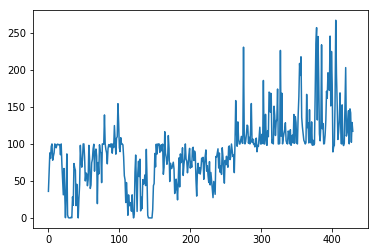

| Reward: 149 | Episode: 430 


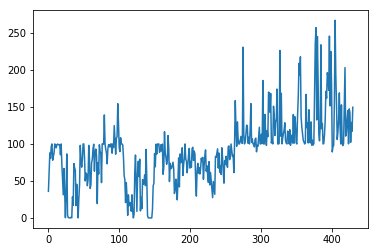

| Reward: 106 | Episode: 431 


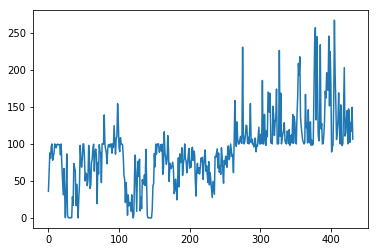

| Reward: 138 | Episode: 432 


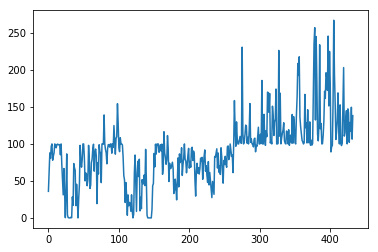

| Reward: 114 | Episode: 433 


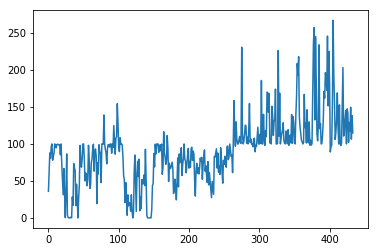

| Reward: 194 | Episode: 434 


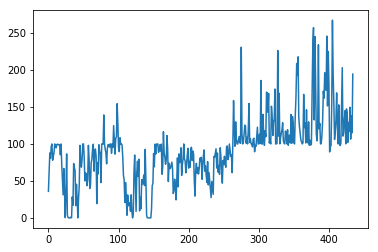

| Reward: 184 | Episode: 435 


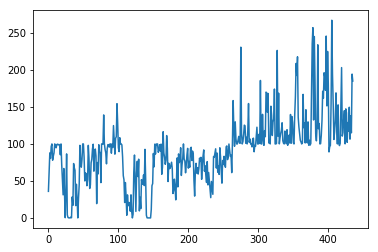

| Reward: 157 | Episode: 436 


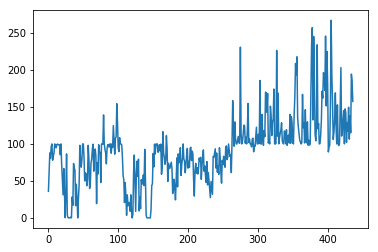

| Reward: 172 | Episode: 437 


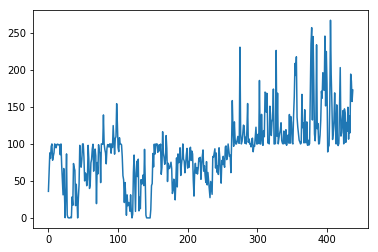

| Reward: 108 | Episode: 438 


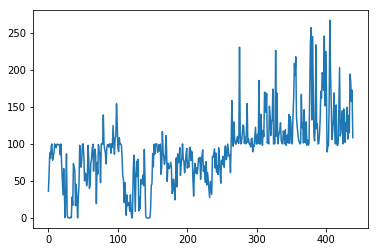

| Reward: 101 | Episode: 439 


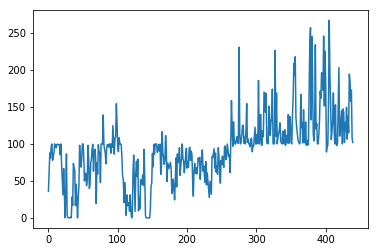

| Reward: 134 | Episode: 440 


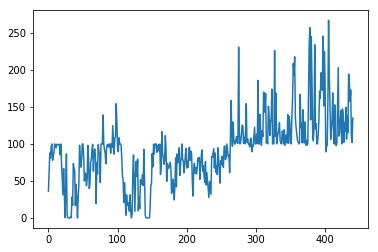

| Reward: 183 | Episode: 441 


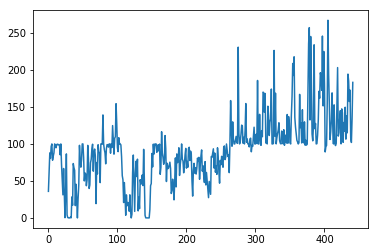

| Reward: 99 | Episode: 442 


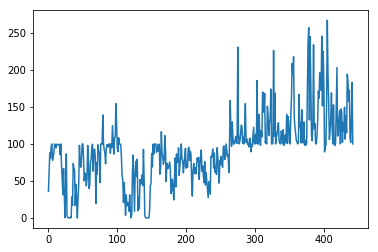

| Reward: 104 | Episode: 443 


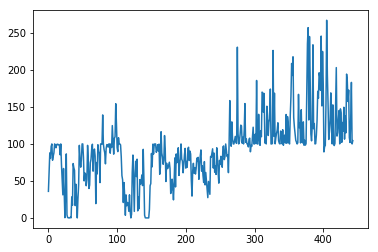

| Reward: 103 | Episode: 444 


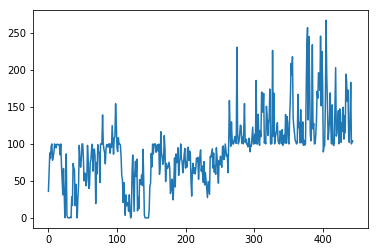

| Reward: 99 | Episode: 445 


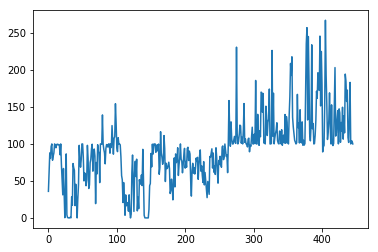

| Reward: 100 | Episode: 446 


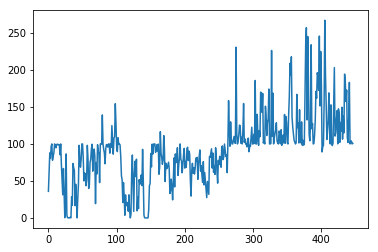

| Reward: 163 | Episode: 447 


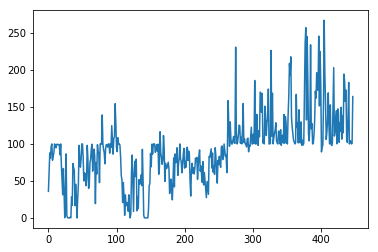

| Reward: 152 | Episode: 448 


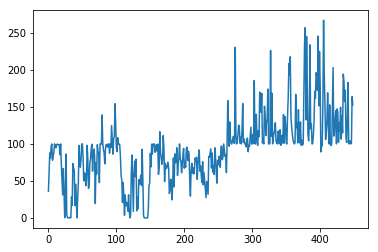

| Reward: 136 | Episode: 449 


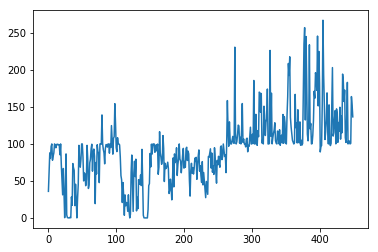

| Reward: 238 | Episode: 450 


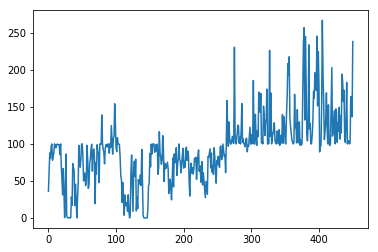

| Reward: 223 | Episode: 451 


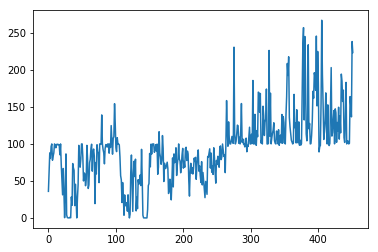

| Reward: 179 | Episode: 452 


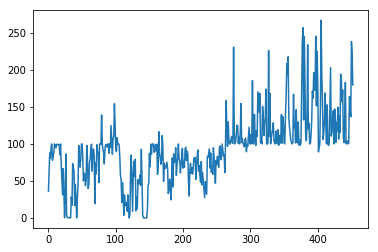

| Reward: 226 | Episode: 453 


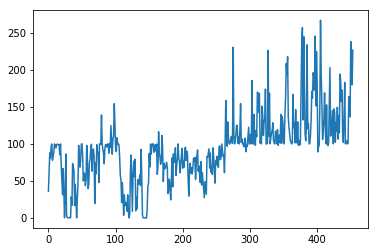

| Reward: 270 | Episode: 454 


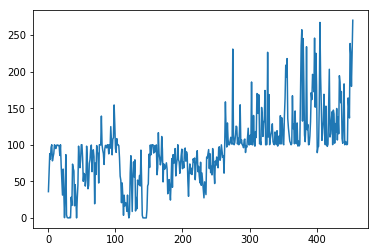

| Reward: 141 | Episode: 455 


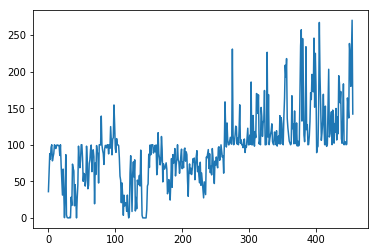

| Reward: 143 | Episode: 456 


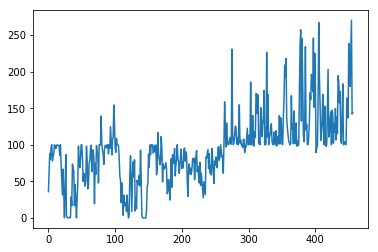

| Reward: 124 | Episode: 457 


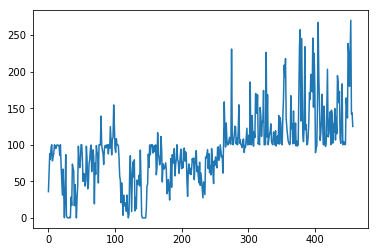

| Reward: 118 | Episode: 458 


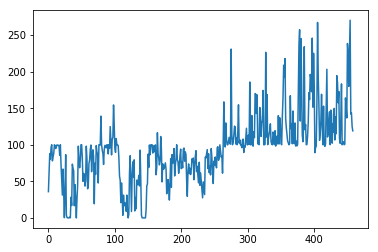

| Reward: 159 | Episode: 459 


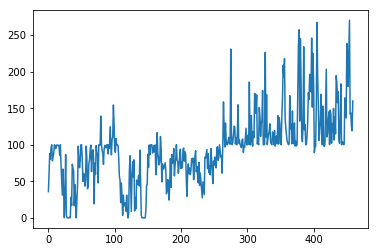

| Reward: 144 | Episode: 460 


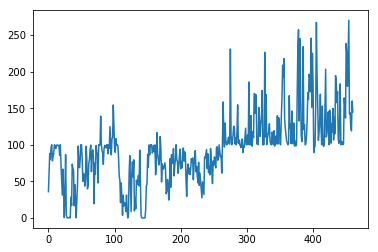

| Reward: 104 | Episode: 461 


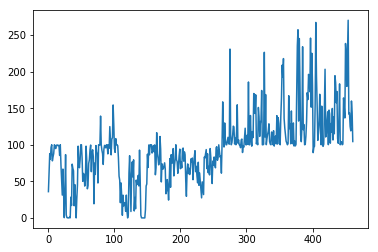

| Reward: 101 | Episode: 462 


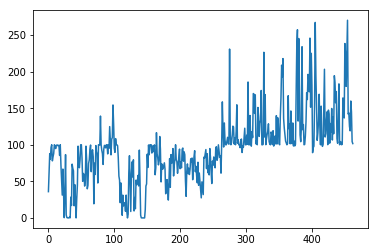

| Reward: 144 | Episode: 463 


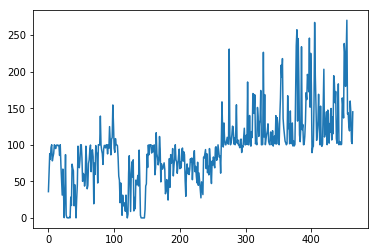

| Reward: 100 | Episode: 464 


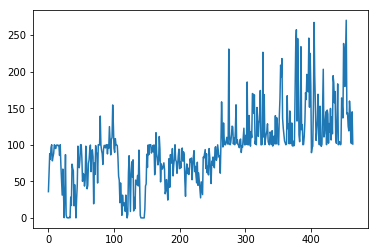

| Reward: 125 | Episode: 465 


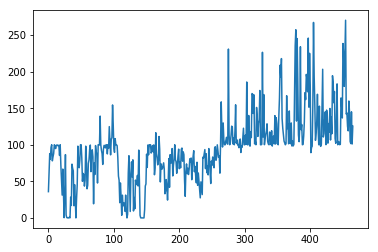

| Reward: 144 | Episode: 466 


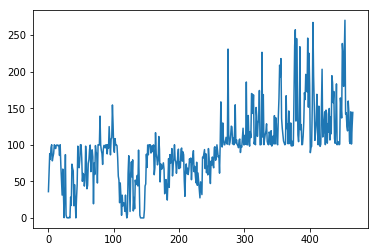

| Reward: 105 | Episode: 467 


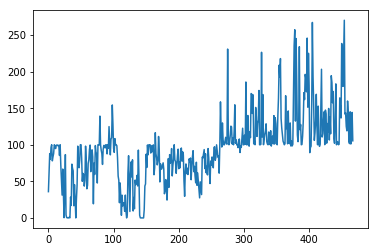

| Reward: 102 | Episode: 468 


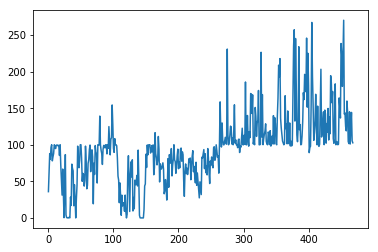

| Reward: 155 | Episode: 469 


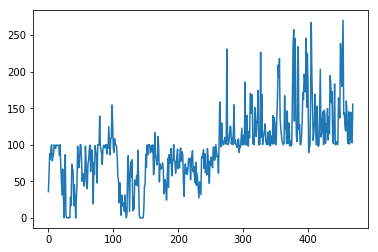

| Reward: 158 | Episode: 470 


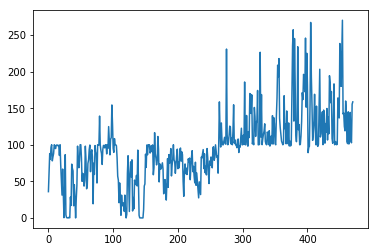

| Reward: 172 | Episode: 471 


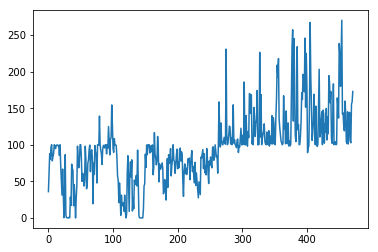

| Reward: 135 | Episode: 472 


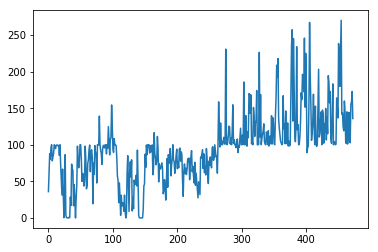

| Reward: 105 | Episode: 473 


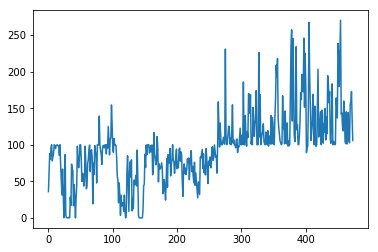

| Reward: 139 | Episode: 474 


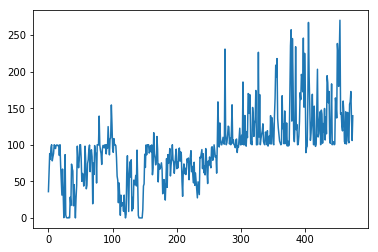

| Reward: 195 | Episode: 475 


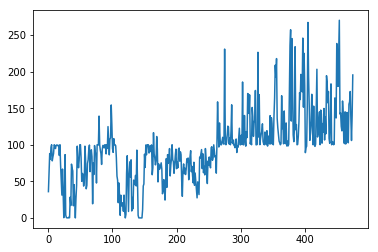

| Reward: 108 | Episode: 476 


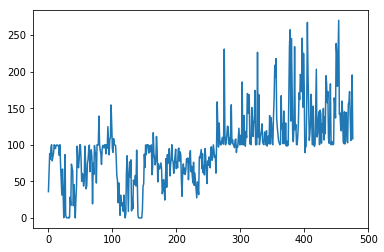

| Reward: 232 | Episode: 477 


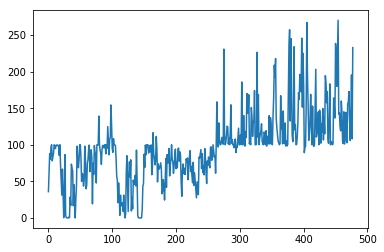

| Reward: 204 | Episode: 478 


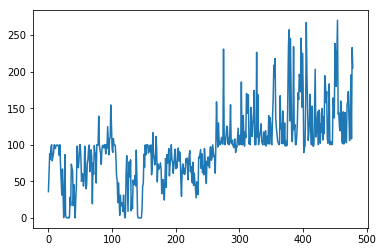

| Reward: 103 | Episode: 479 


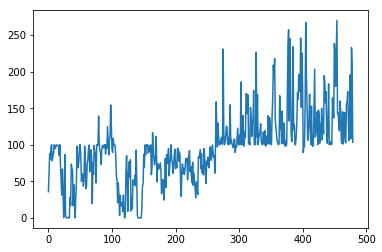

| Reward: 109 | Episode: 480 


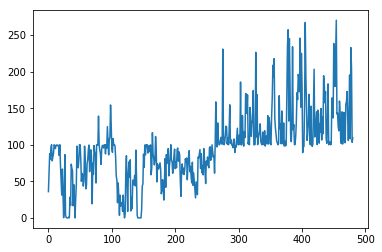

| Reward: 100 | Episode: 481 


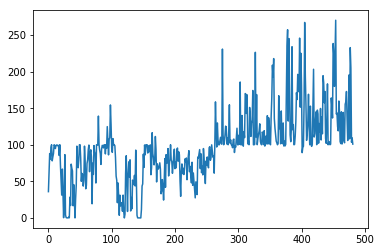

| Reward: 120 | Episode: 482 


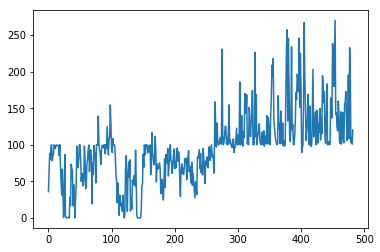

| Reward: 142 | Episode: 483 


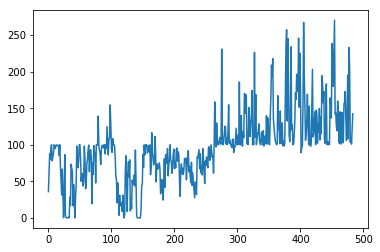

| Reward: 208 | Episode: 484 


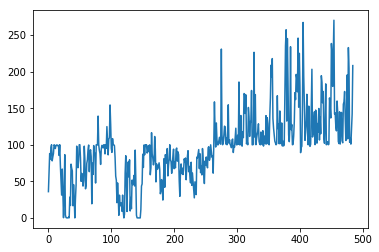

| Reward: 174 | Episode: 485 


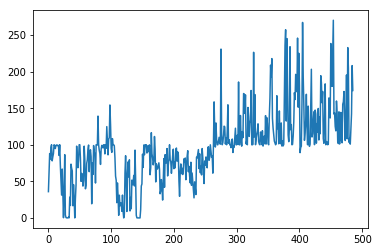

| Reward: 147 | Episode: 486 


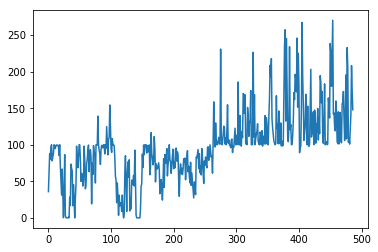

| Reward: 109 | Episode: 487 


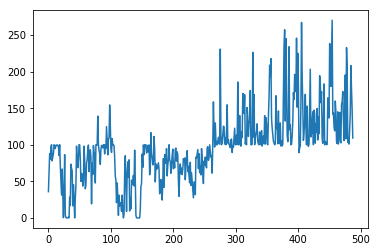

| Reward: 100 | Episode: 488 


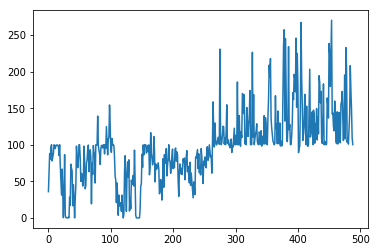

| Reward: 135 | Episode: 489 


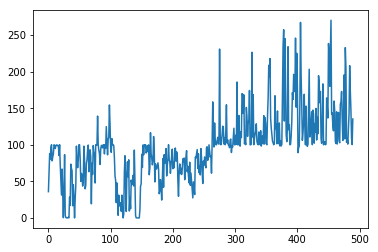

| Reward: 118 | Episode: 490 


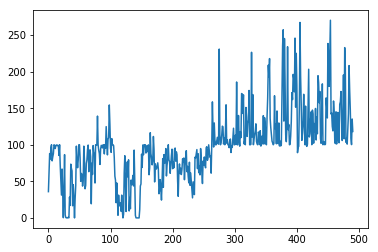

| Reward: 107 | Episode: 491 


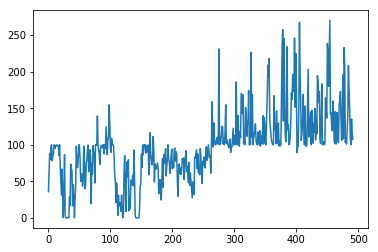

| Reward: 123 | Episode: 492 


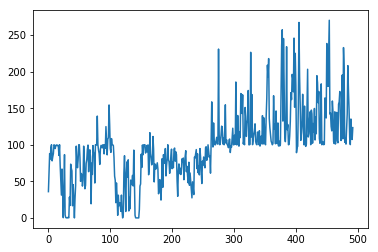

| Reward: 144 | Episode: 493 


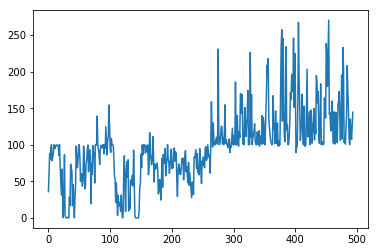

| Reward: 130 | Episode: 494 


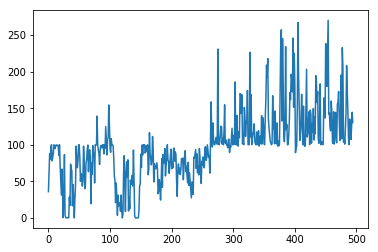

| Reward: 206 | Episode: 495 


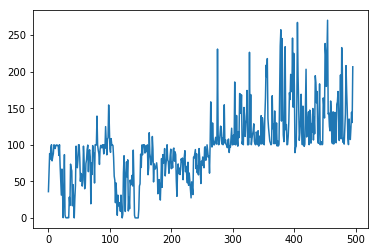

| Reward: 107 | Episode: 496 


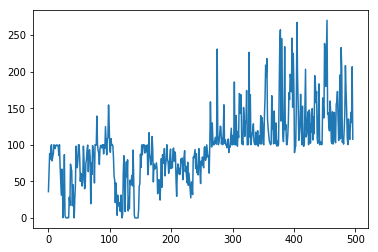

| Reward: 117 | Episode: 497 


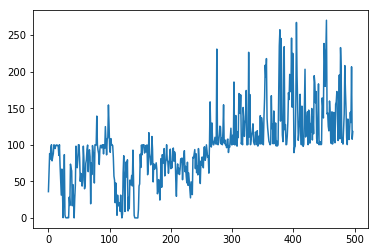

In [ ]:
with tf.Session() as sess:

    #env = gym.make('Pendulum-v0')
    #env = gym.make('MountainCarContinuous-v0')
    env = LASEnv('127.0.0.1', 19997)

    LASAgent = LASAgent_Actor_Critic(sess, env)

    #LASAgent.train()

    # Learning records
    episod_reward_memory = deque(maxlen = 10000)

    # Train parameters
    max_episodes = 50000
    max_episode_len = 1000
    render_env = False
    reward = 0
    done = False
    for i in range(max_episodes):
        observation = env.reset()   
        ep_reward = 0    
        for j in range(max_episode_len):

            if render_env == True:
                env.render()

            # Added exploration noise
            action = LASAgent.perceive_and_act(observation,reward,done)

            observation, reward, done, info = env.step(action[0])
            ep_reward += reward
            if done or j == (max_episode_len-1):
                print('| Reward: {:d} | Episode: {:d} '.format(int(ep_reward),i))
                episod_reward_memory.append(ep_reward)
                plot_cumulative_reward(episod_reward_memory)
                break

    #env.destroy()